In [1]:
import skimage
from skimage.transform import resize
import cv2
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (8,8)
import glob
import os
import json
import random
import pickle

Select files with a reliable cut line:

In [ ]:
good_files = []
good_file_names = []
gf = open("good_videos.txt", "r")
for ln in gf:
  good_files.append(int(ln.split()[0]))
  good_file_names.append(ln.split()[1])
gf.close()

Function to read ground truth:

In [2]:
def read_json_file(json_file):
    with open(json_file) as f:
        data = json.load(f)
    date = data['cbc_performed_at']
    cbc_results = data['cbc_results']
    hgb = cbc_results['hgb']
    wbc = cbc_results['wbc']
    hgb = float(hgb)
    wbc = float(wbc)
    date = date.split('-')
    date2 = date[1] + "/" + date[2] + "/" + date[0]
    return date2, hgb, wbc

All the files with wbc annotations and ground truth:

In [3]:
files = glob.glob('/mnt/litebc/patient-data' + '/**/**/annotation.json')
files2 = []
for i in range(len(files)):
    k = files[i].replace('annotation.json', 'stabilzedAvi.avi')  
    k1 = "/".join(files[i].split("/")[:-2]) + "/ground_truth.json"
    if os.path.exists(k) and os.path.exists(k1):
        files2.append((files[i], k, k1))

Some info about the videos we have. I would like to see higher number of annotated white blood cells in the videos with higher number of white blood cells in the laboratory test:

In [4]:
video_names = []
wbc_count = []
video_lengths = []
annot_groups = []
for anno_file_name, avi_file, gt_file in files2:
    try:
        f = open(anno_file_name)
        anno = json.load(f)
        f.close()
        annotation_keys = list(anno["annotations"]["annotations"].keys())
    except:
        print("ERROR", anno_file_name)
        continue

    try:
        cap = cv2. VideoCapture(avi_file)
        length = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        cap.release()
    except:
        print("ERROR", avi_file)
        continue
    video_names.append(avi_file)
    wbc_count.append(read_json_file(gt_file)[2])
    video_lengths.append(length)
    annot_groups.append(len(annotation_keys))

ERROR /mnt/litebc/patient-data/71705065-2e54-4478-9656-3c092b38a9fb_0/04c7277c-b8f2-4f3d-bd4b-13126caf920a/annotation.json
ERROR /mnt/litebc/patient-data/3b1ef79f-1b1a-4550-a03f-2786911c60de_0/980c8bbe-8635-4496-a922-3a2044aace58/annotation.json


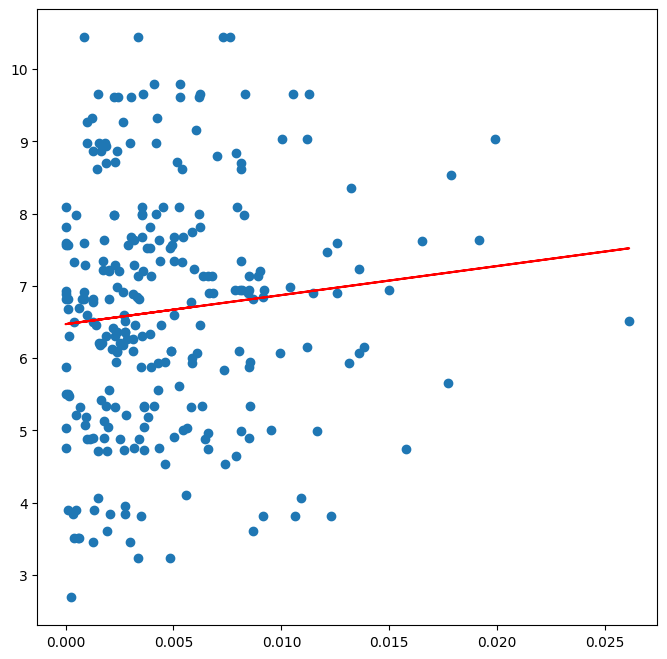

In [5]:
annot_groups_rate = [annot_groups[i]/video_lengths[i] for i in range(len(wbc_count))]
m, c = np.polyfit(annot_groups_rate, wbc_count, 1)
plt.plot(annot_groups_rate, [m*count + c for count in annot_groups_rate], 'r', label='Fitted line')
plt.scatter(annot_groups_rate, wbc_count)
plt.show()

Reading file names of the pickled files that contain data about the videos:

In [6]:
files = glob.glob('xy_data/' + '**.pkl')
len(files)

196

Get images of the videos with the reliable cut line:

0 /mnt/litebc/patient-data/7c26b706-b940-4b64-8367-da281f9e8392_0/cf3faae0-d498-4694-97aa-501f0dd7b6be/stabilzedAvi.avi


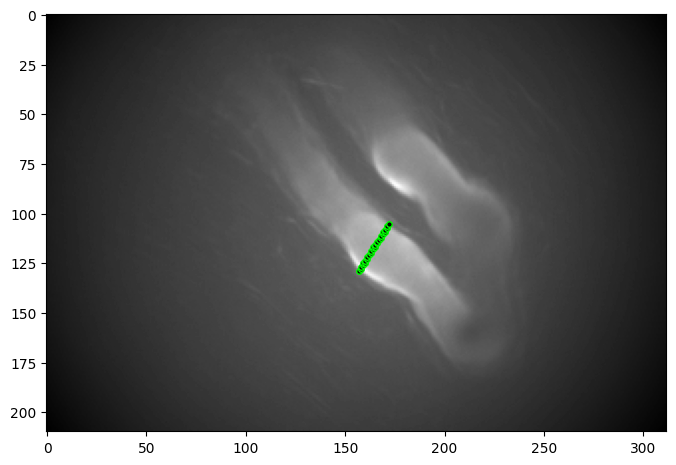

1 /mnt/litebc/patient-data/1241b82f-6d7f-4734-be0b-90a6803f9650_0/62e43185-580f-48ae-bd27-34712863f891/stabilzedAvi.avi


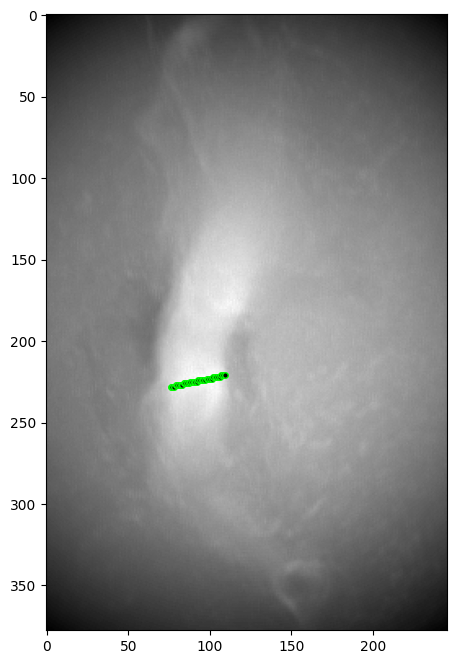

6 /mnt/litebc/patient-data/152a8884-f14f-459d-aade-77543e1e10e9_0/994040fb-91a7-4ceb-b358-7eeba263775d/stabilzedAvi.avi


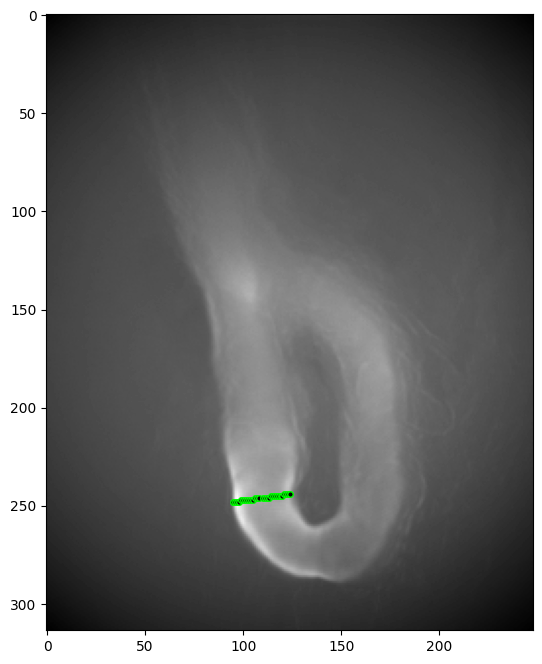

7 /mnt/litebc/patient-data/b5d2938e-71b3-4099-9de4-7ab46f4f2405_0/b9568b51-08c4-4d36-a3d4-242ef820c0cd/stabilzedAvi.avi


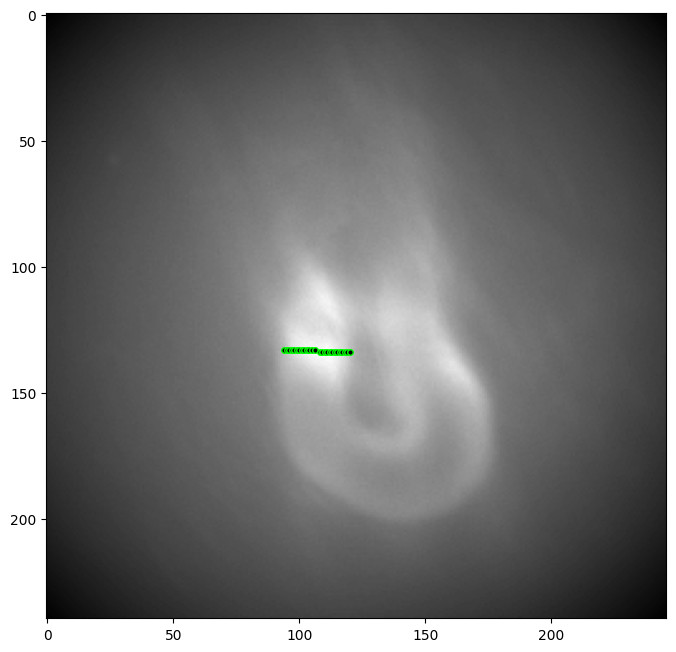

10 /mnt/litebc/patient-data/7820c1c4-ca7b-4112-98e4-4d34c0c36257_0/97e3f0ff-2490-409d-8de3-2ac4124357cb/stabilzedAvi.avi


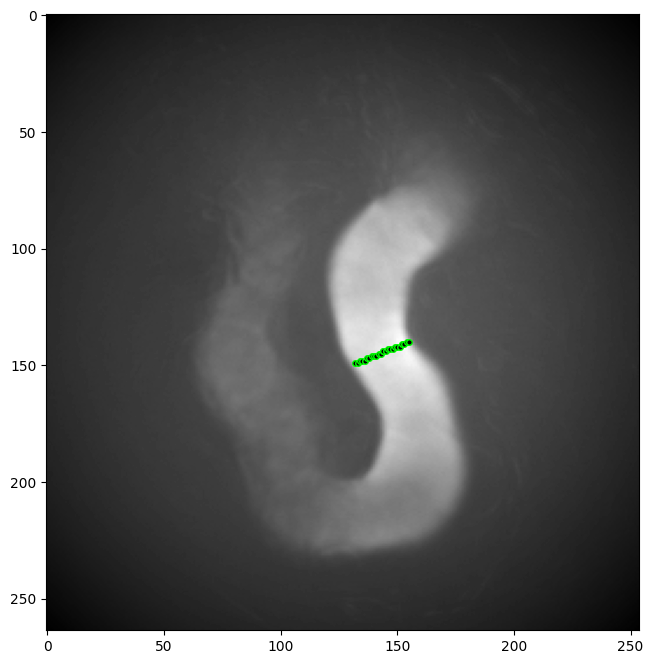

11 /mnt/litebc/patient-data/0b2d5ab0-0066-4c78-b51a-d970fd31e49a_0/898cedaa-01ea-46f5-9a33-a46b7680dbb0/stabilzedAvi.avi


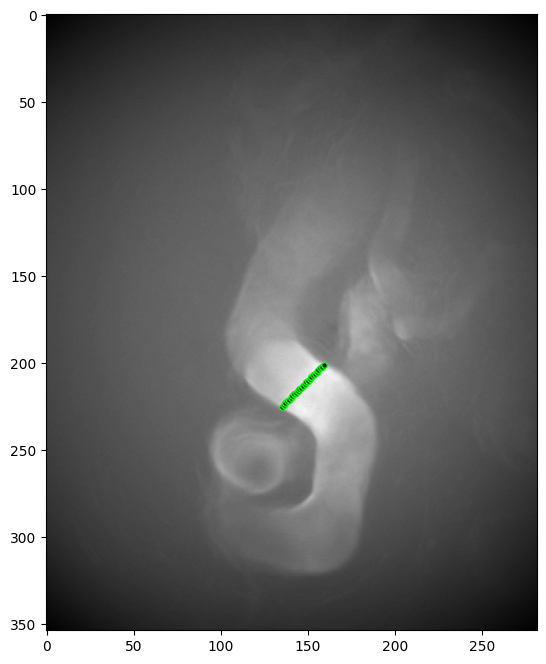

13 /mnt/litebc/patient-data/682e9776-dd87-4eac-a678-58cd0c939d58_0/39393122-e385-499c-aa70-ef398747939e/stabilzedAvi.avi


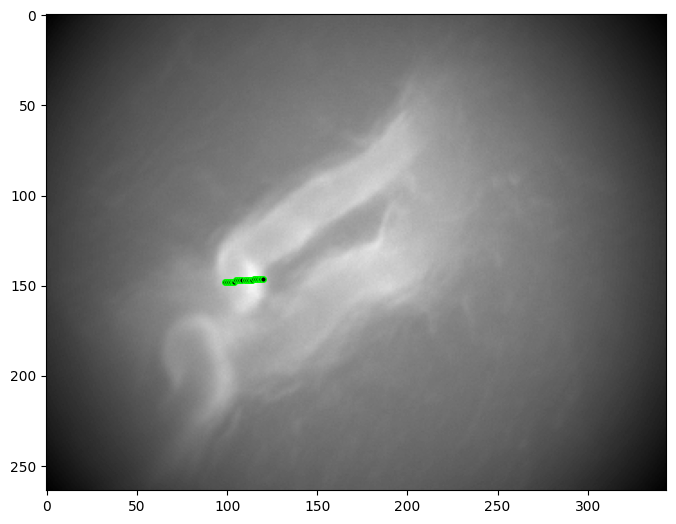

19 /mnt/litebc/patient-data/5047a6bb-b6f2-4b02-84c9-329b473367d9_0/2308f5f1-ba15-4a06-ac45-13931b36e3e4/stabilzedAvi.avi


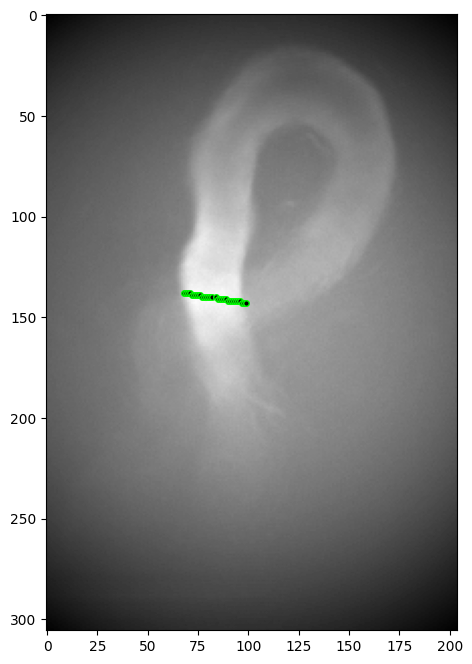

25 /mnt/litebc/patient-data/3b398051-5dd6-4491-ae07-b1cf4909e3f4_0/c06d5417-a39e-4475-982a-337ef2e8b27d/stabilzedAvi.avi


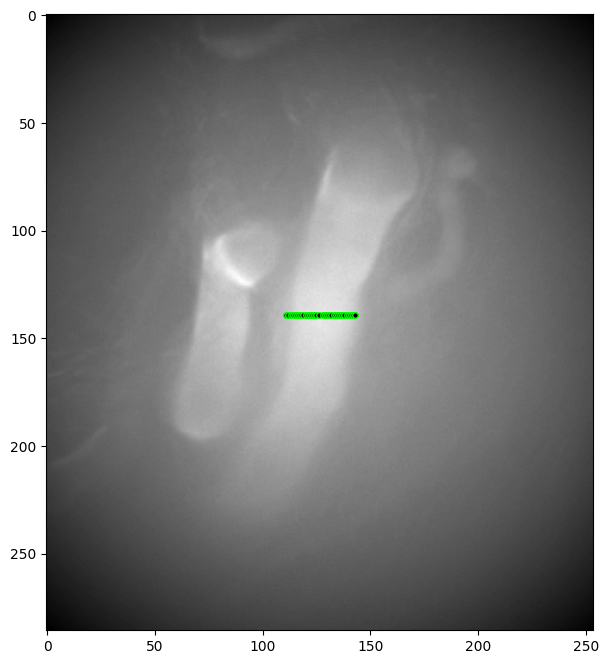

29 /mnt/litebc/patient-data/5073835d-7d5f-4a1e-93c5-ee6e3fba0292_0/3eebd6b7-cb88-4d00-85b5-3f708eb5766b/stabilzedAvi.avi


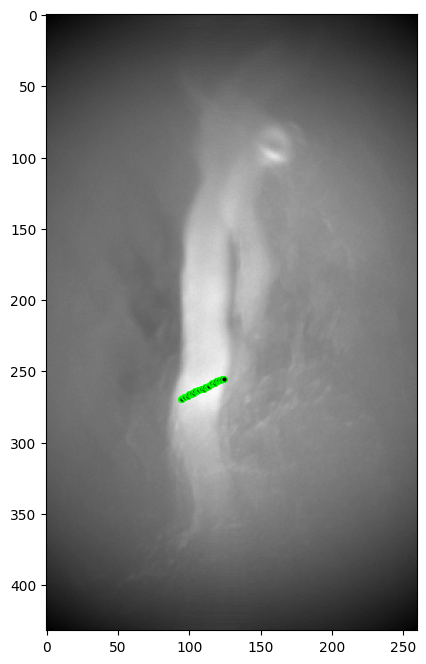

30 /mnt/litebc/patient-data/85fe750c-c73e-4586-a31a-9d2e82576f24_0/89e15447-9092-4747-8cf1-f70d7a027433/stabilzedAvi.avi


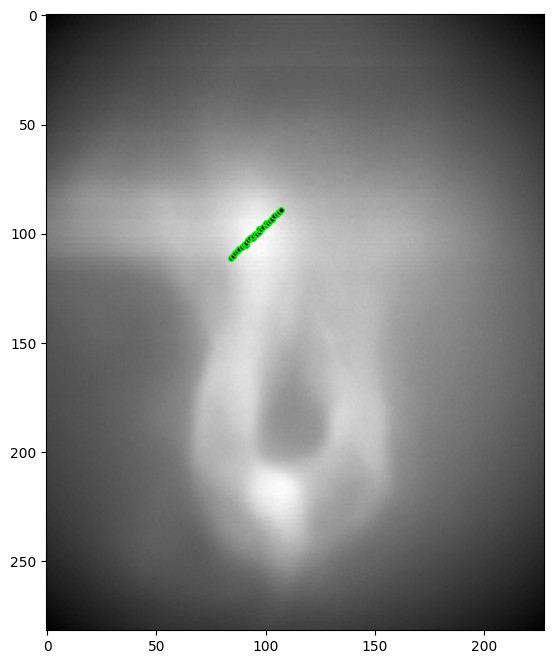

32 /mnt/litebc/patient-data/abd0cc4c-f122-435c-9a1e-3710a807547f_0/cb9d2bda-b9f4-4418-9848-2a6ec5e67b2d/stabilzedAvi.avi


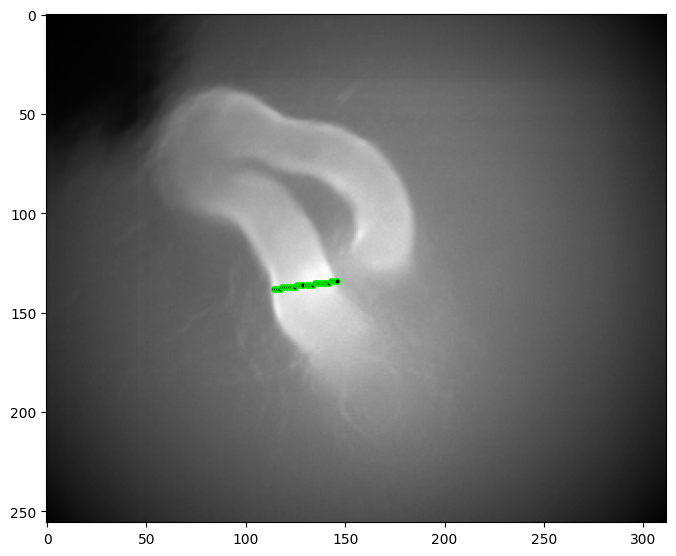

33 /mnt/litebc/patient-data/4e2ab29c-28fe-4e0a-881e-96052cc5515e_0/b57333ca-2895-401b-a983-85209d23e360/stabilzedAvi.avi


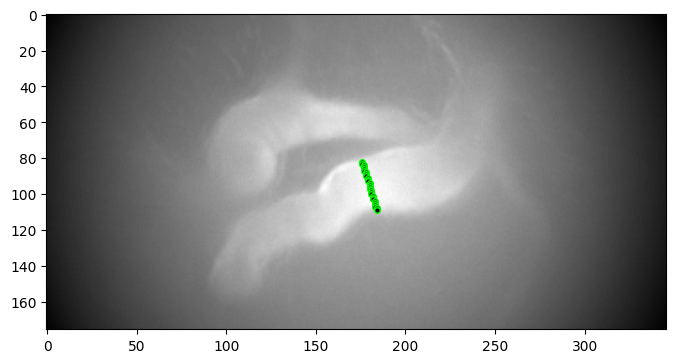

37 /mnt/litebc/patient-data/17e343c2-f1e3-495e-98f0-5b53032a3191_0/17e37ee6-3ebf-47c5-a4ff-fe62ce9008e3/stabilzedAvi.avi


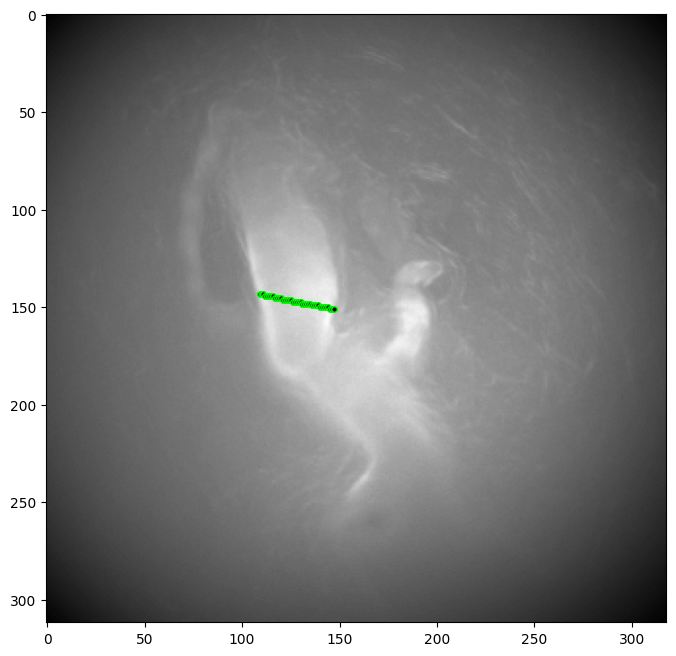

38 /mnt/litebc/patient-data/64992153-68a0-4d36-839c-bfb3de6298ab_0/2585adcd-96a0-481f-9240-e7145bd59c55/stabilzedAvi.avi


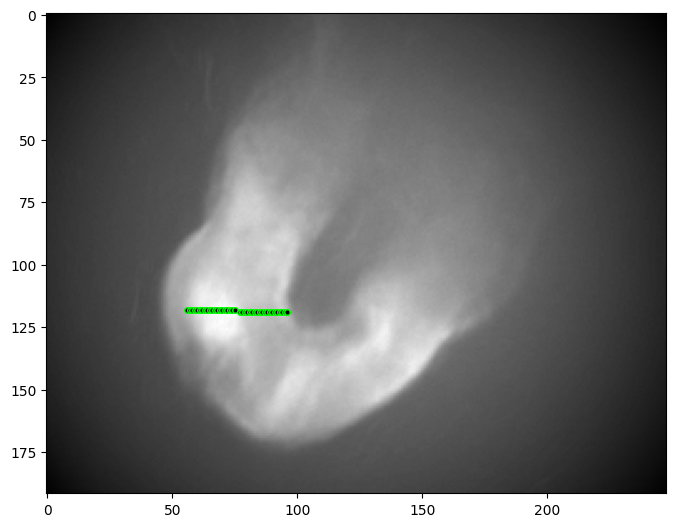

39 /mnt/litebc/patient-data/87253ded-af0b-4569-aa72-dac556d7f7ac_0/69aa6a7e-7f55-42bc-9192-f2aa2fbd1316/stabilzedAvi.avi


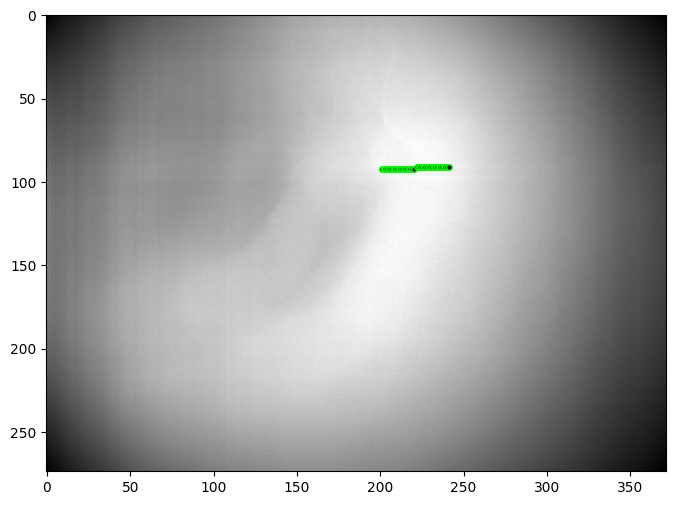

40 /mnt/litebc/patient-data/5cab0b56-4934-4976-b0b2-2f753fab07e1_0/b216a84b-1a44-4b08-aee9-59371885618d/stabilzedAvi.avi


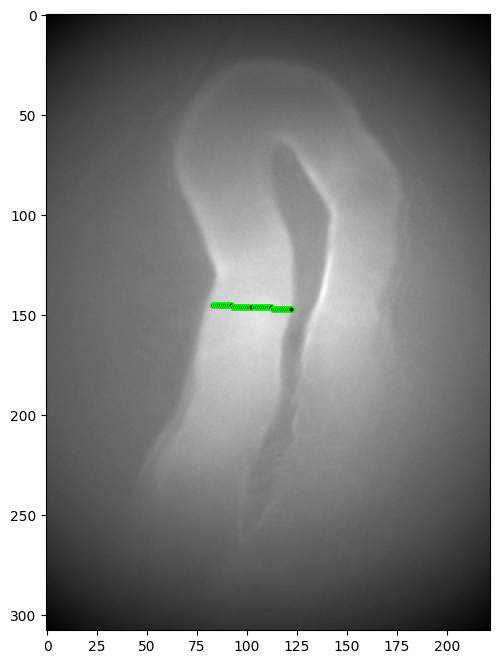

42 /mnt/litebc/patient-data/373307d5-ea75-4442-9c39-455ce9f1460f_0/0ce26667-e716-4bdf-9dc9-86acd007939b/stabilzedAvi.avi


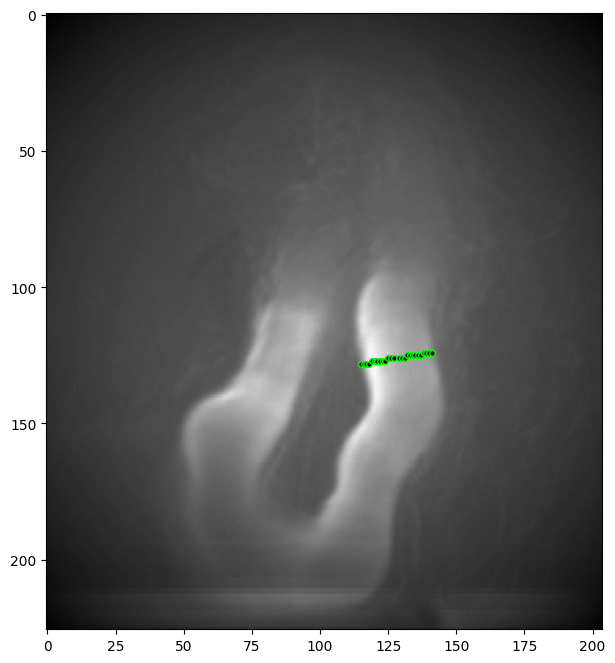

44 /mnt/litebc/patient-data/3c0849c3-8f8a-4f6e-85c1-ebcd05e7fca9_0/b3bb38f9-7f51-4bca-ac3c-54bd6f9a8aed/stabilzedAvi.avi


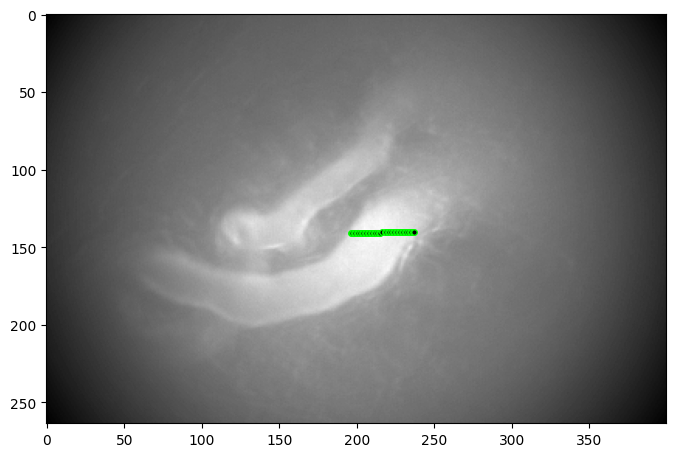

45 /mnt/litebc/patient-data/8a19e33b-1768-45ae-a3c3-8692da5a090c_0/e175cb4a-21f6-4ba0-ae8d-47e41fb5894b/stabilzedAvi.avi


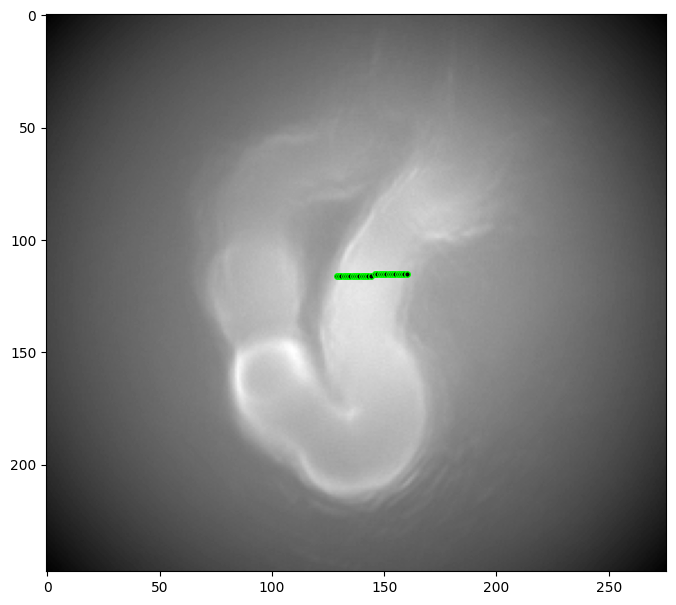

46 /mnt/litebc/patient-data/29e7e4af-06ad-4deb-ac39-de9e3fcc870c_0/634bfca4-bf5a-4e14-9bda-f1361e1fde29/stabilzedAvi.avi


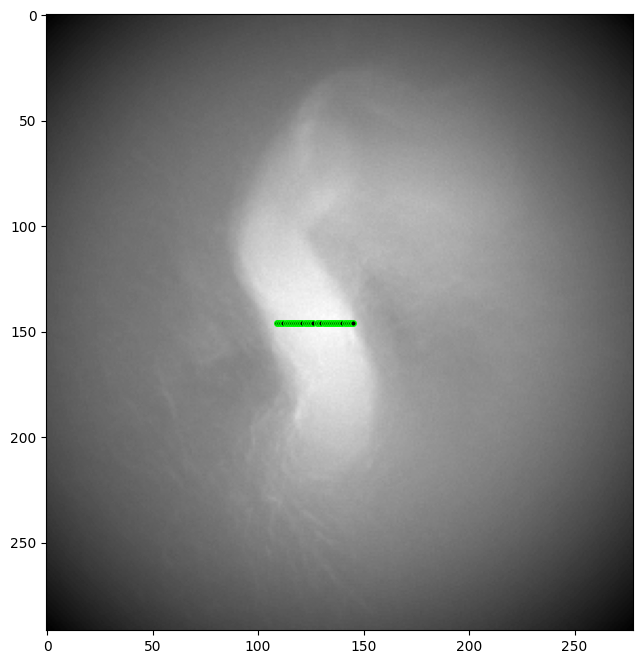

49 /mnt/litebc/patient-data/24af5a26-ba9b-4a6b-b7d8-5b9379e32892_0/d4f03d44-ec7c-4093-8f2a-ac23f06b8d42/stabilzedAvi.avi


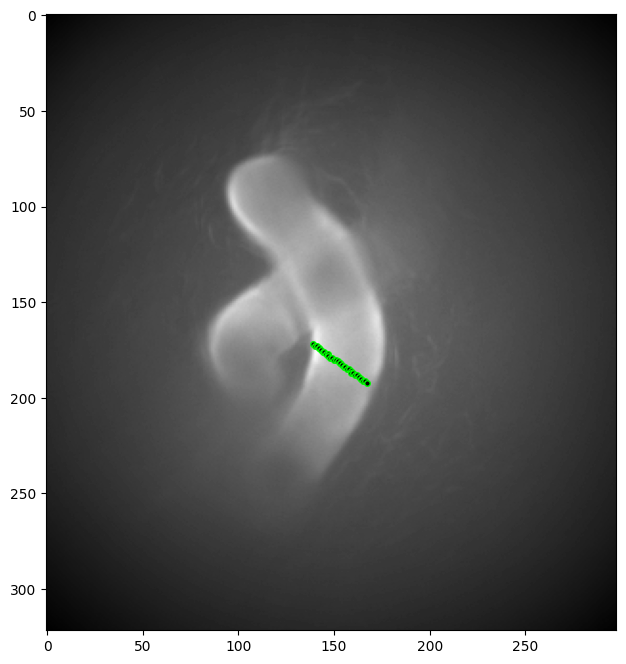

50 /mnt/litebc/patient-data/959f64b4-0ec6-42d1-9d37-3ae2962a8810_0/44e58b15-dea5-4b0b-8fb5-10bf81f23236/stabilzedAvi.avi


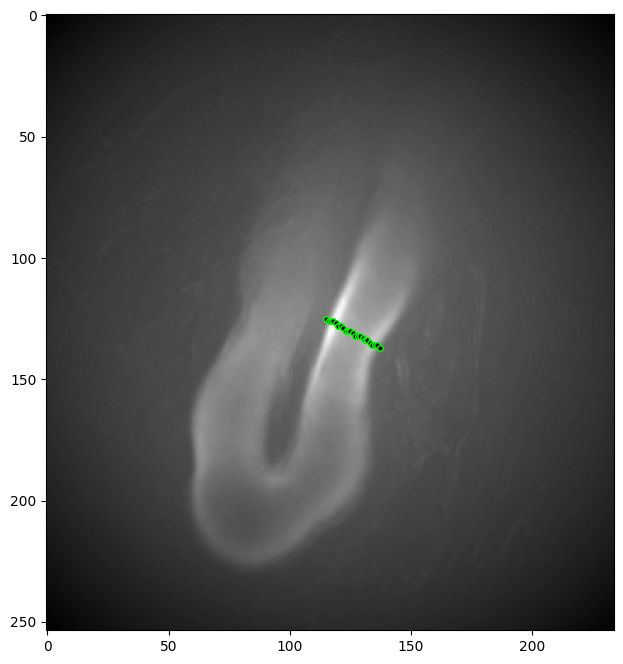

54 /mnt/litebc/patient-data/5073835d-7d5f-4a1e-93c5-ee6e3fba0292_0/e87b4f95-227c-43d3-9ed4-e9b7c87305b4/stabilzedAvi.avi


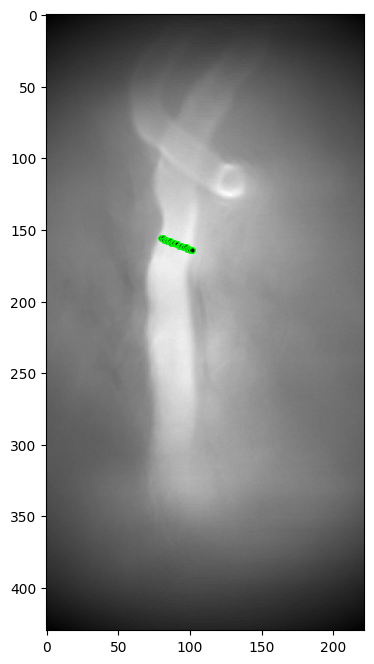

57 /mnt/litebc/patient-data/273d22d5-fc12-4125-afee-6d4e3a4d8fc8_0/3c8550ab-c19b-4435-9899-b3c5f8ea7c0e/stabilzedAvi.avi


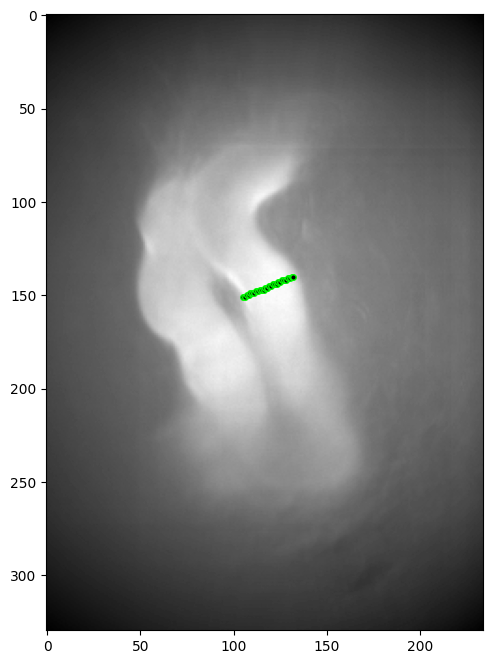

59 /mnt/litebc/patient-data/4792fef1-f6b5-4699-8eed-d671320d68b5_0/04ce31b0-8193-4f92-b419-179842870be7/stabilzedAvi.avi


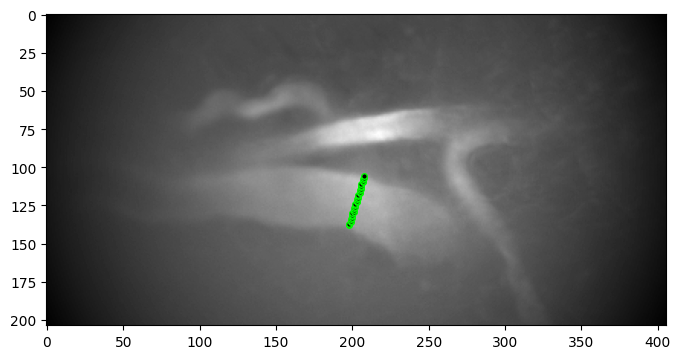

61 /mnt/litebc/patient-data/0aa735ec-0ba7-4eb3-b5a8-a0c8d4e9d9ec_0/1f9704df-ddef-4625-9986-e50921085326/stabilzedAvi.avi


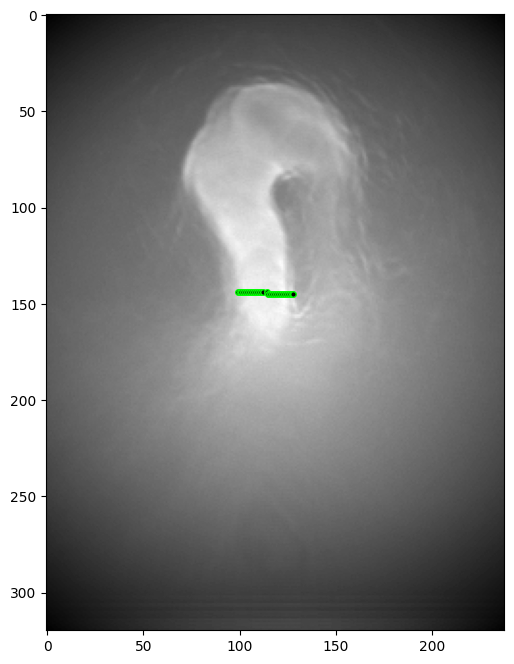

62 /mnt/litebc/patient-data/19f8a889-f5c6-4e30-96d9-a7f4ce373095_0/72f529e8-c2ca-4a23-980a-6c2ea3367846/stabilzedAvi.avi


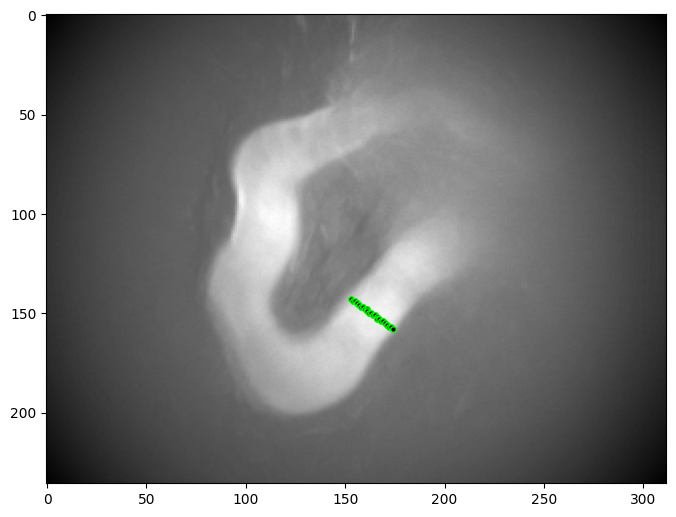

64 /mnt/litebc/patient-data/5073835d-7d5f-4a1e-93c5-ee6e3fba0292_0/940d80a4-32dd-4bc6-a8f0-016f31e88547/stabilzedAvi.avi


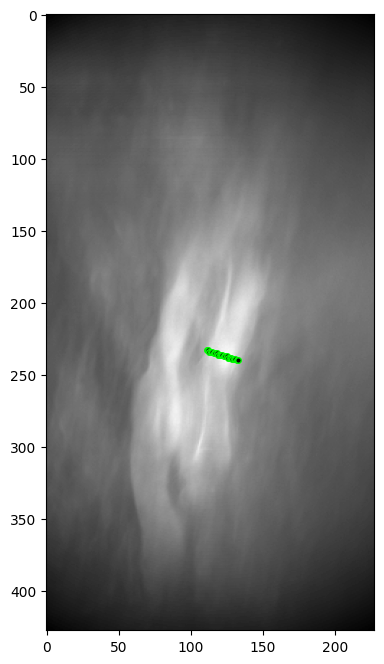

65 /mnt/litebc/patient-data/abd0cc4c-f122-435c-9a1e-3710a807547f_0/e42257fc-09e6-4d0c-a156-0ea29e7f5dfe/stabilzedAvi.avi


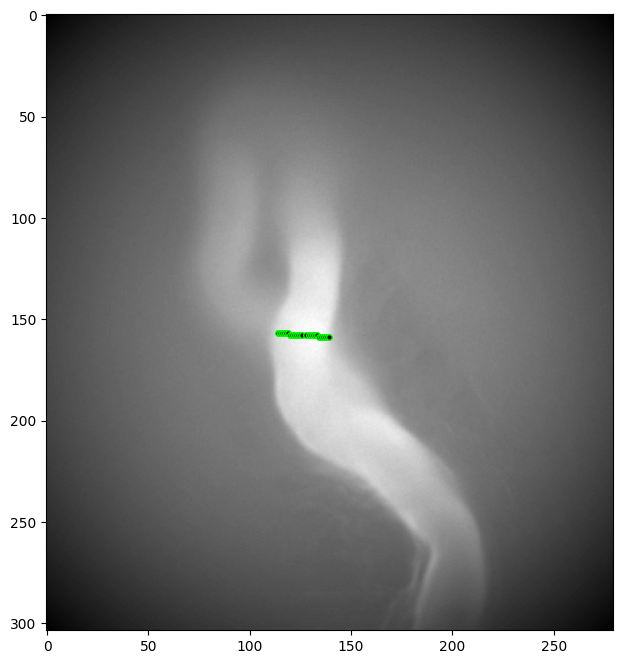

71 /mnt/litebc/patient-data/19f8a889-f5c6-4e30-96d9-a7f4ce373095_0/0d3bf3a6-452e-47b1-908d-a362fd92b114/stabilzedAvi.avi


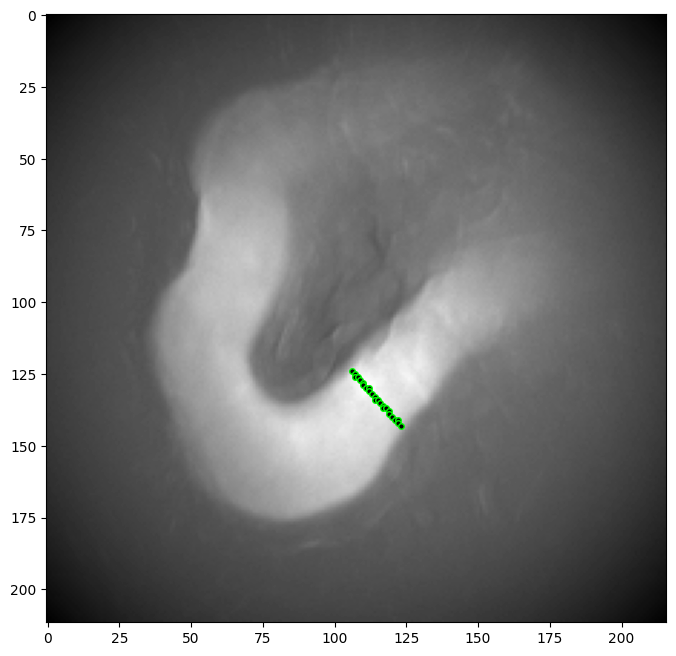

72 /mnt/litebc/patient-data/abd0cc4c-f122-435c-9a1e-3710a807547f_0/26348871-4091-4a19-8499-10237a170e6d/stabilzedAvi.avi


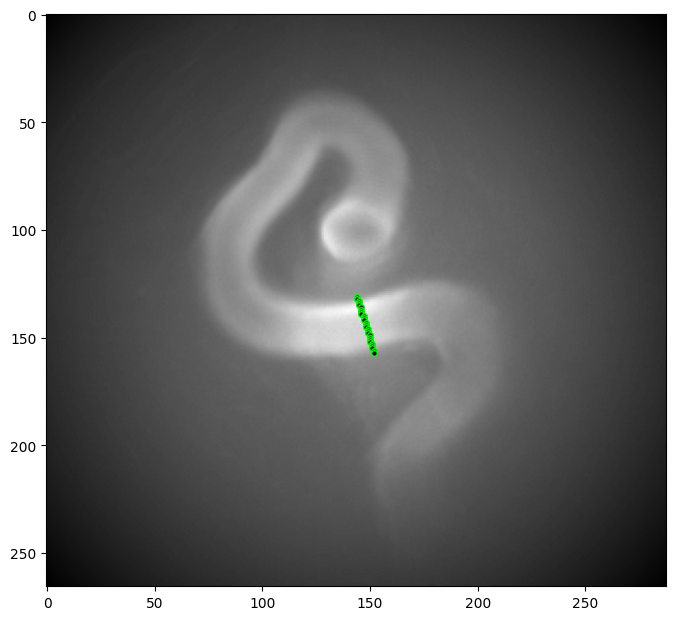

74 /mnt/litebc/patient-data/3b01f66d-b246-41c1-9ece-ea6a0a6cb46b_0/81faea79-0135-496f-98ac-b071eaf23d1d/stabilzedAvi.avi


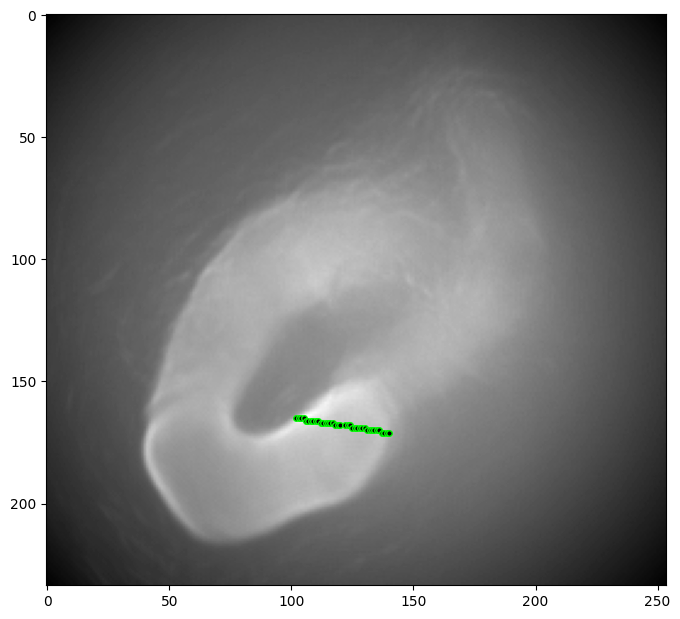

76 /mnt/litebc/patient-data/682e9776-dd87-4eac-a678-58cd0c939d58_0/e9ff028b-568e-4cd9-a70e-6f99010f0ef2/stabilzedAvi.avi


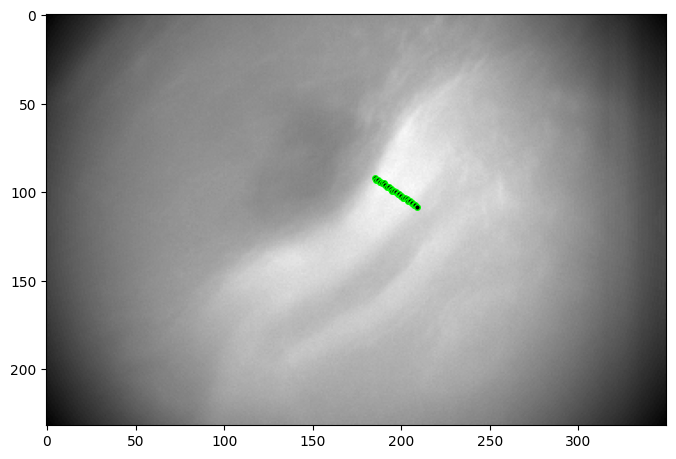

78 /mnt/litebc/patient-data/141c0441-f517-4f0d-a3dc-9da92d9ac1a9_0/52d24f5a-537a-4682-9c12-a576c3319f01/stabilzedAvi.avi


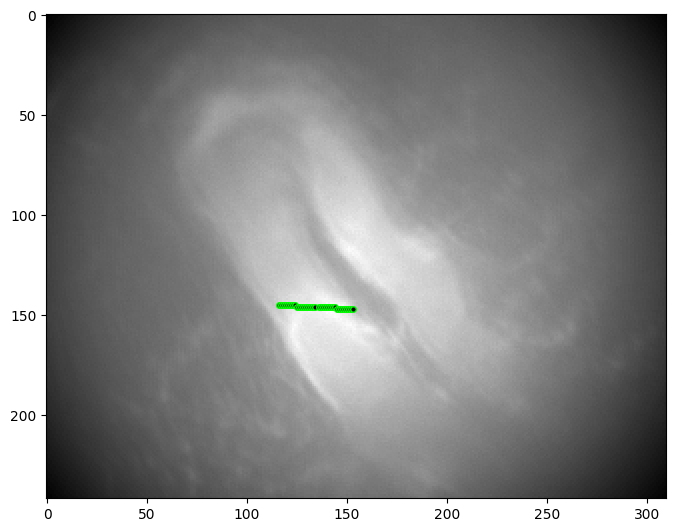

79 /mnt/litebc/patient-data/152a8884-f14f-459d-aade-77543e1e10e9_0/c6a96f8e-23c5-44c0-b7c5-0bcd9f1f7831/stabilzedAvi.avi


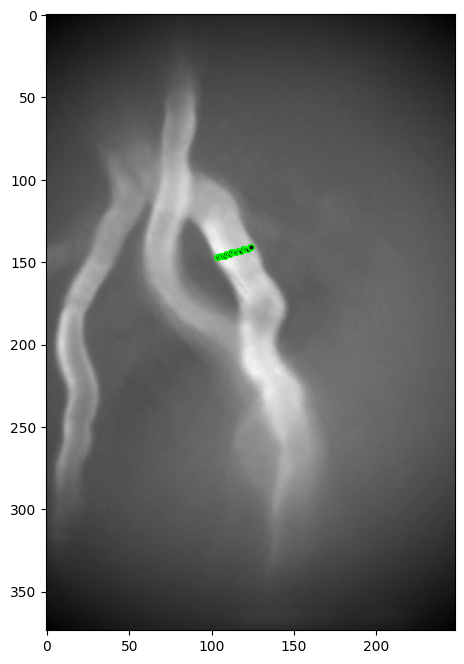

82 /mnt/litebc/patient-data/916018c4-2d52-4ec4-bcf6-428771d4bcf4_0/10d2da6f-0724-4d1c-99fd-5bb5eaefe0c5/stabilzedAvi.avi


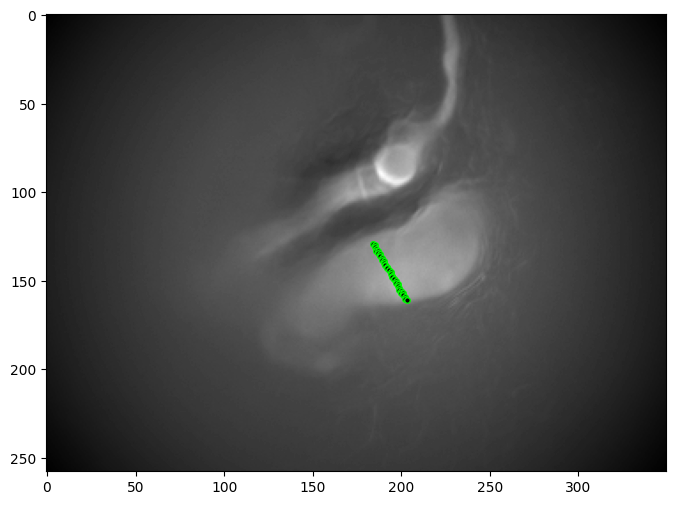

84 /mnt/litebc/patient-data/abd0cc4c-f122-435c-9a1e-3710a807547f_0/7ea69e45-21c1-40db-aed5-78cfac24b431/stabilzedAvi.avi


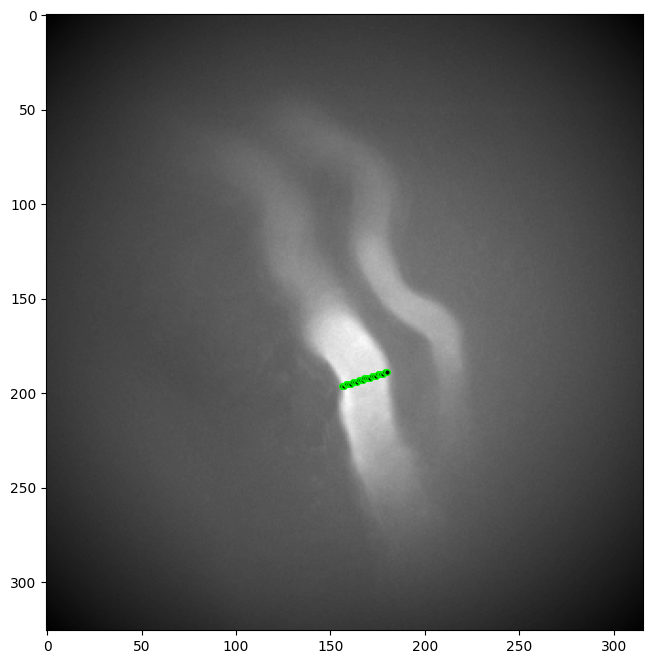

85 /mnt/litebc/patient-data/867745e6-d7e7-4fdb-b50d-24e85e320420_0/b56cf74d-6640-48df-9145-68fc93fd4b84/stabilzedAvi.avi


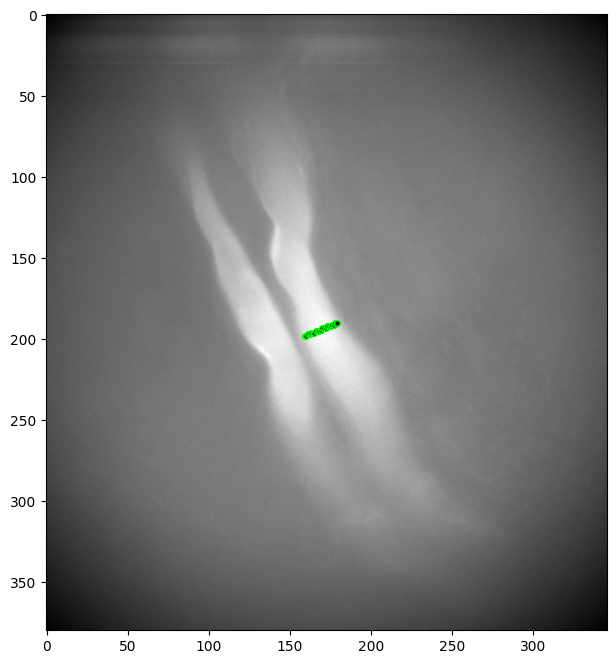

86 /mnt/litebc/patient-data/17e343c2-f1e3-495e-98f0-5b53032a3191_0/009bc71e-70e1-43bb-aca1-8a65b77eac36/stabilzedAvi.avi


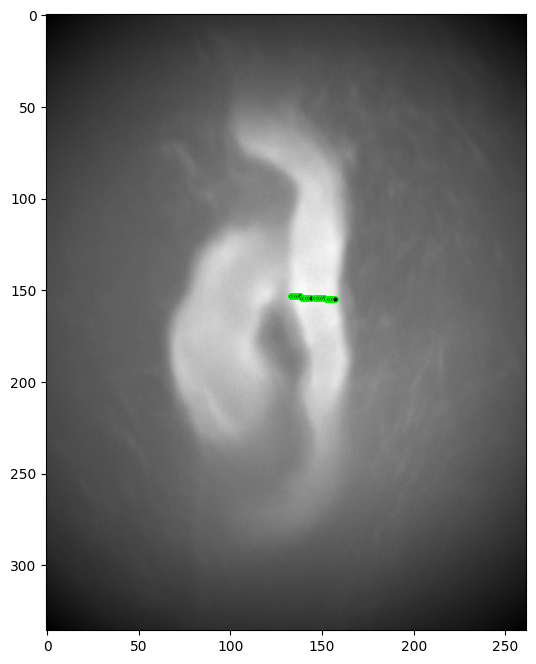

90 /mnt/litebc/patient-data/2eb53f16-78ae-4756-acfa-ee4390e42e51_0/0c269576-d3c0-4202-84b8-d464bb19c649/stabilzedAvi.avi


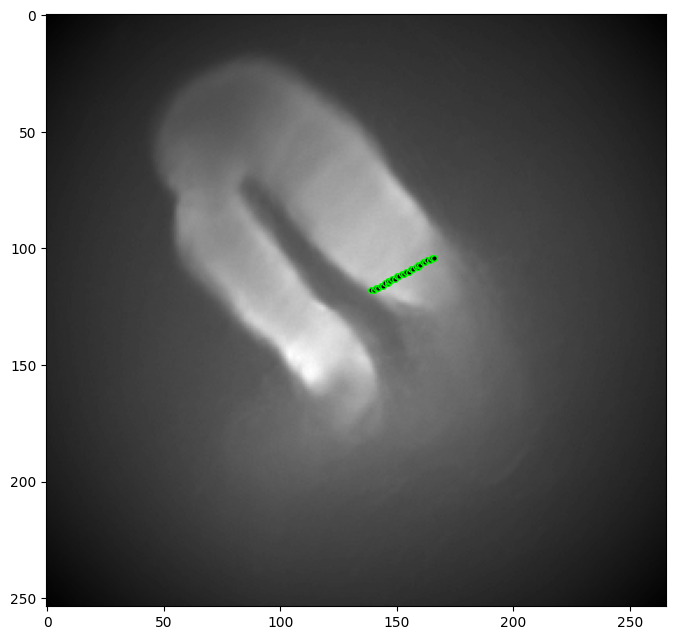

92 /mnt/litebc/patient-data/152a8884-f14f-459d-aade-77543e1e10e9_0/b46c39e9-6dcd-4b70-952a-7b295b070d82/stabilzedAvi.avi


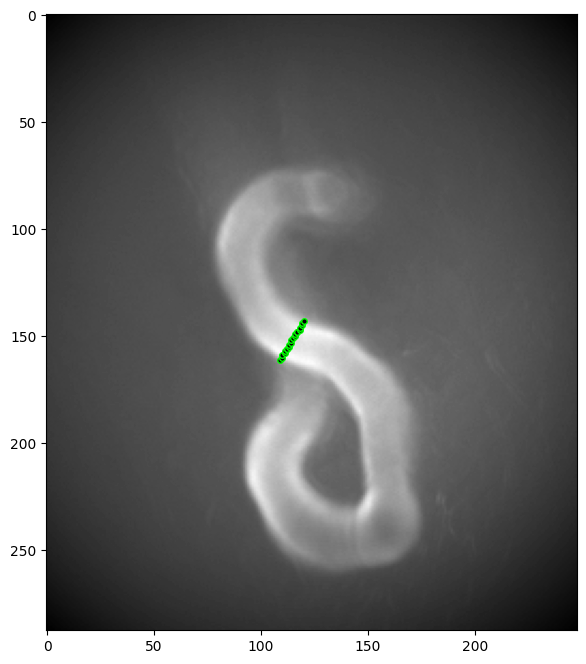

93 /mnt/litebc/patient-data/abfb7295-6b3a-46b9-8067-d11b1f320492_0/cd60a746-c717-4ff3-9836-f527bd5bc75a/stabilzedAvi.avi


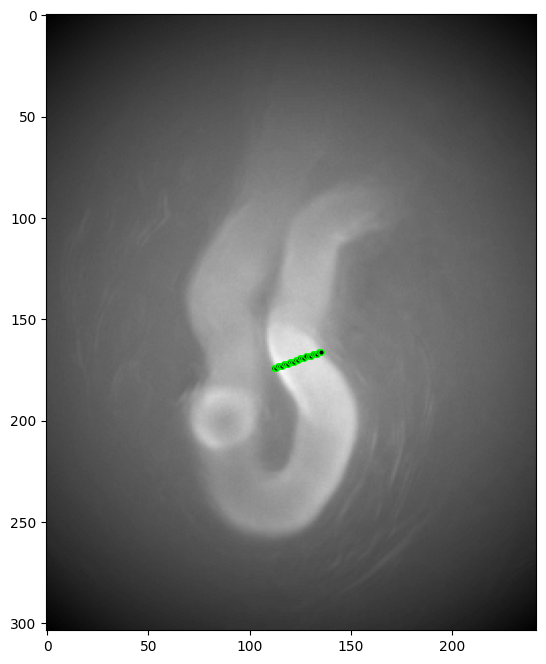

96 /mnt/litebc/patient-data/8b935942-1078-464a-bc46-33f1ca21563b_0/1c9a5355-2522-4004-af69-18a4166a8f16/stabilzedAvi.avi


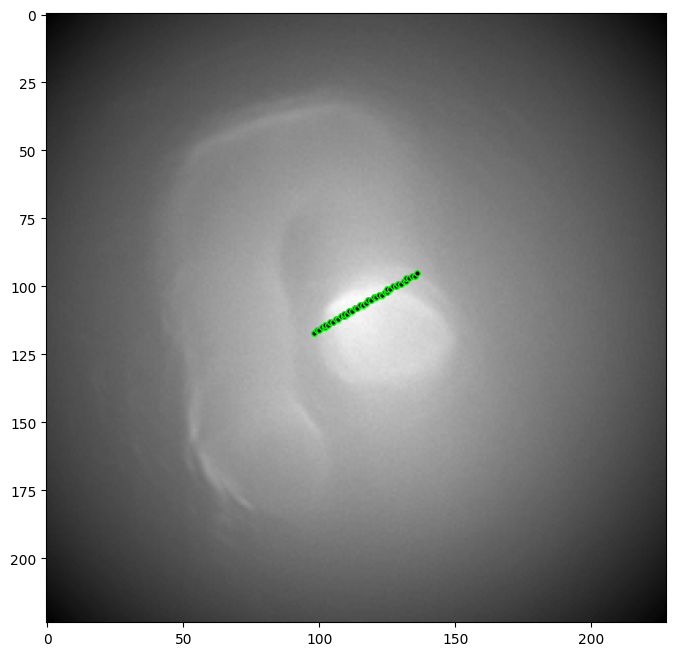

97 /mnt/litebc/patient-data/0aa53d24-a2c3-44ee-858e-b8dd9e95bda4_0/341ce672-3a9a-4c12-bcf0-0790b392dee1/stabilzedAvi.avi


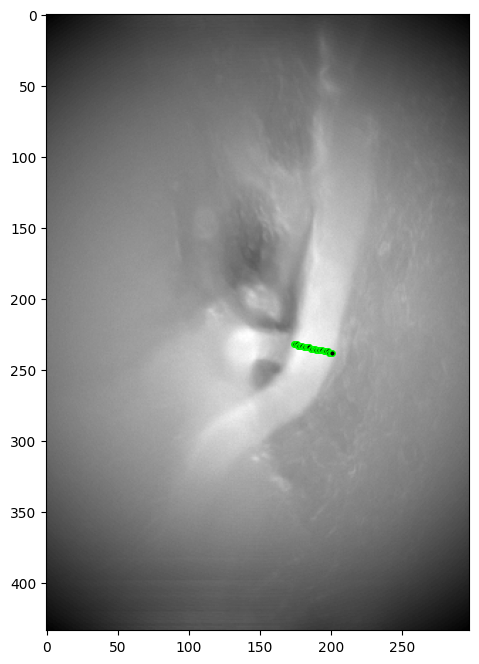

98 /mnt/litebc/patient-data/2eb53f16-78ae-4756-acfa-ee4390e42e51_0/75786548-a398-4355-bc5d-3f0dff720ab7/stabilzedAvi.avi


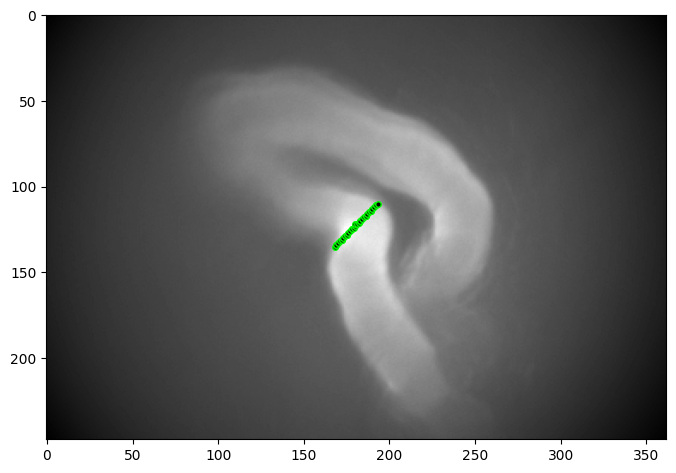

100 /mnt/litebc/patient-data/56347b44-96ee-472a-bb93-4e0be8c68000_0/0bf1c838-0167-459f-9659-3dd3116dc1f4/stabilzedAvi.avi


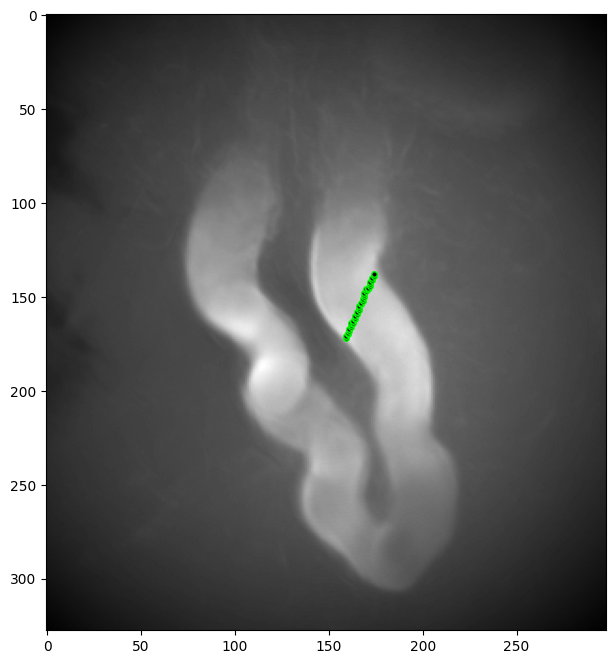

111 /mnt/litebc/patient-data/9387d761-ce12-47bb-abc8-349ce298b03f_0/9b11d0f0-3994-464f-b1bc-56a6a146035f/stabilzedAvi.avi


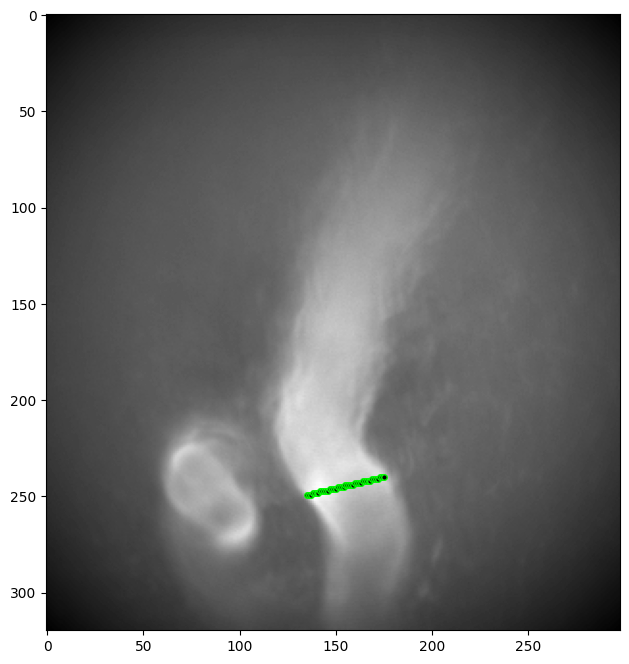

113 /mnt/litebc/patient-data/0aa53d24-a2c3-44ee-858e-b8dd9e95bda4_0/9d3588cd-cea2-468d-b3c6-941571a4a6d7/stabilzedAvi.avi


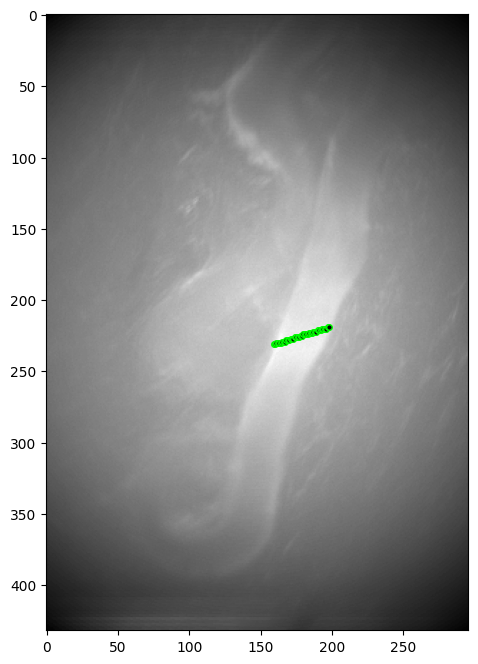

116 /mnt/litebc/patient-data/611f30bc-66be-442b-873d-b50831bd269c_0/86adbcc2-5607-4414-96e9-48fbfb392523/stabilzedAvi.avi


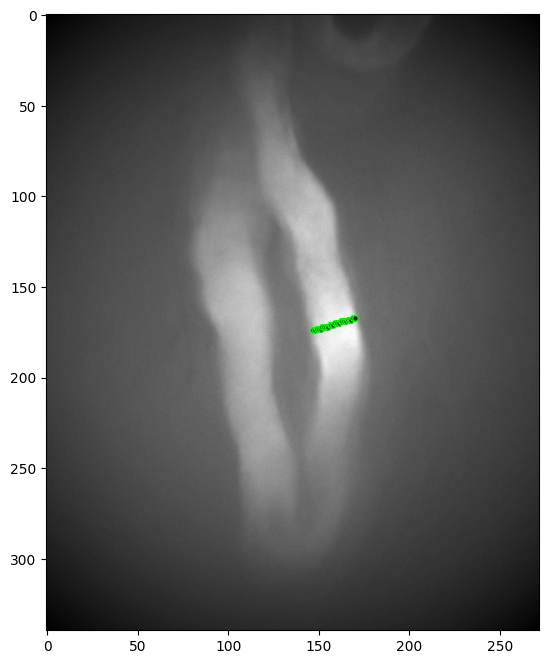

119 /mnt/litebc/patient-data/72099d2a-0d25-4074-b887-50677d9b7baf_0/295b5946-8dc4-462e-b6e1-94f480c1239c/stabilzedAvi.avi


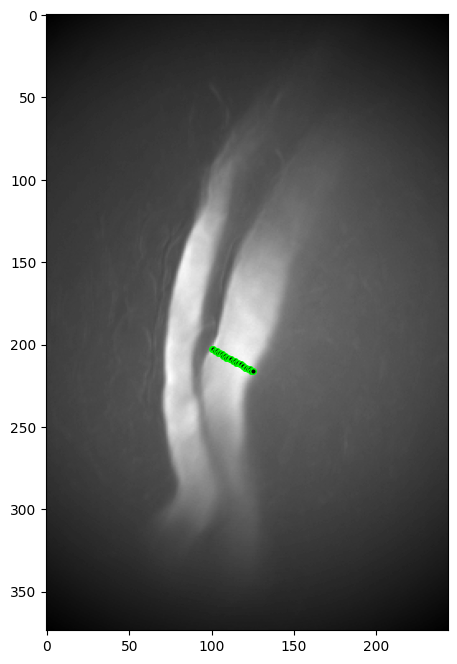

121 /mnt/litebc/patient-data/2952f457-d884-43f3-aa7e-3b65e0fd4dd4_0/8dac11bc-3013-4c12-ab1c-ea94dbc3eb19/stabilzedAvi.avi


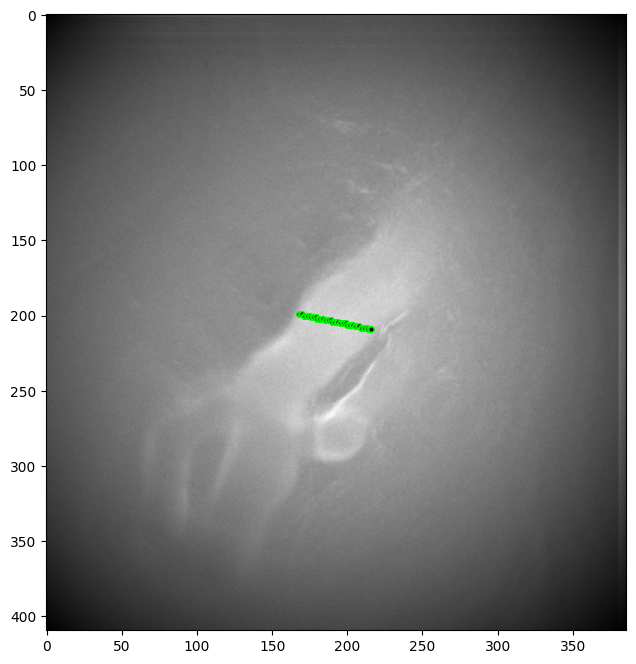

122 /mnt/litebc/patient-data/9e424ff4-1be9-4cb0-bfa7-a9780892712d_0/23950b2c-be35-4c70-8a8c-c1e0e03d688e/stabilzedAvi.avi


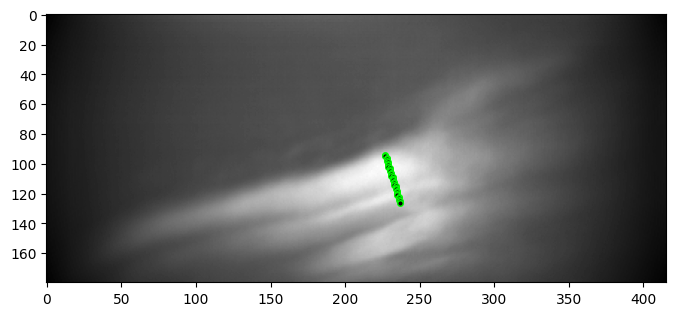

123 /mnt/litebc/patient-data/6cca22c6-a204-44cc-9c26-88ad29899b9c_0/76debb6b-9262-4cd3-bb9e-a9f542093f74/stabilzedAvi.avi


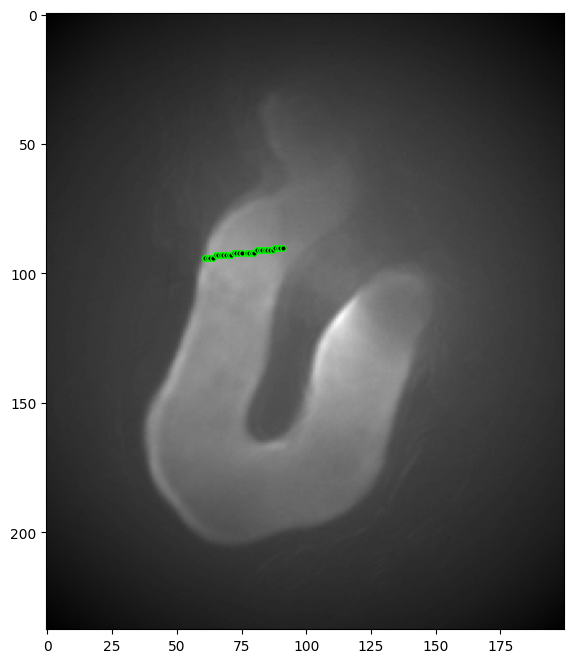

124 /mnt/litebc/patient-data/0650605b-9672-426d-888b-7c65df67b6de_0/ad85d772-52f0-42b2-a2b3-2850e95a0be6/stabilzedAvi.avi


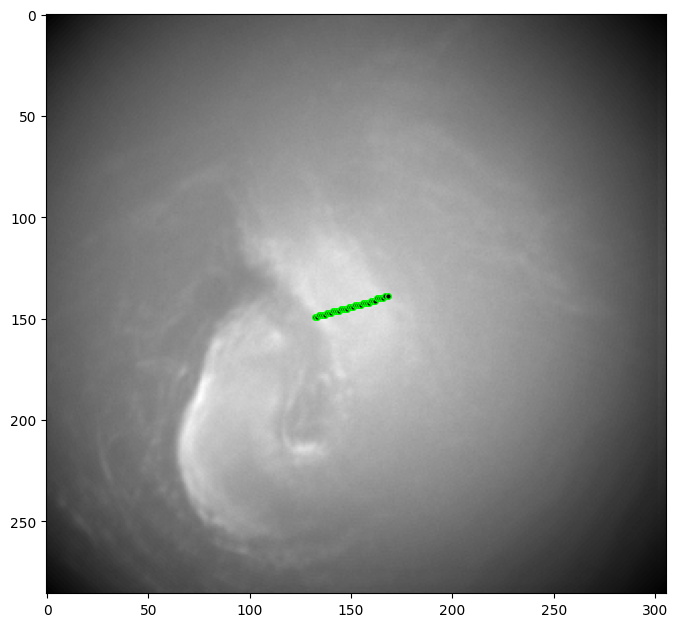

127 /mnt/litebc/patient-data/7b246205-666a-4c89-af3d-b9e4df74d051_0/af66c223-b050-4d64-9e32-7f590d90c5a5/stabilzedAvi.avi


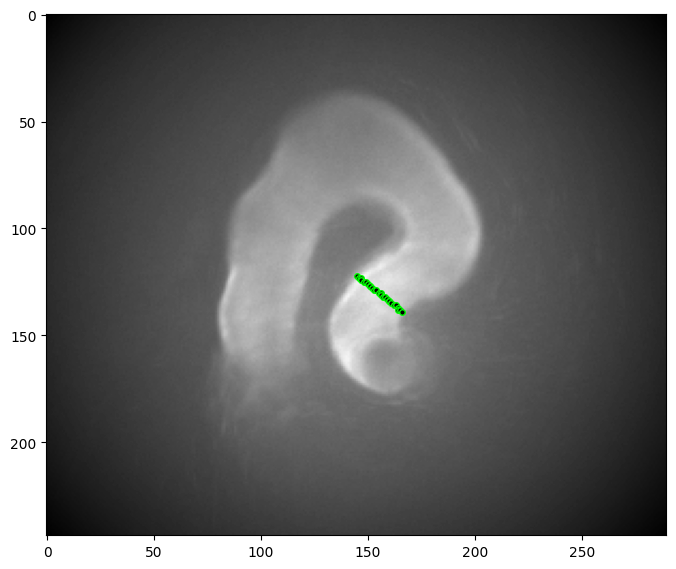

128 /mnt/litebc/patient-data/ac4c5f21-79b8-433f-9908-d701f064f38f_0/5b916deb-f166-4191-80df-8e8f2c6ac4b3/stabilzedAvi.avi


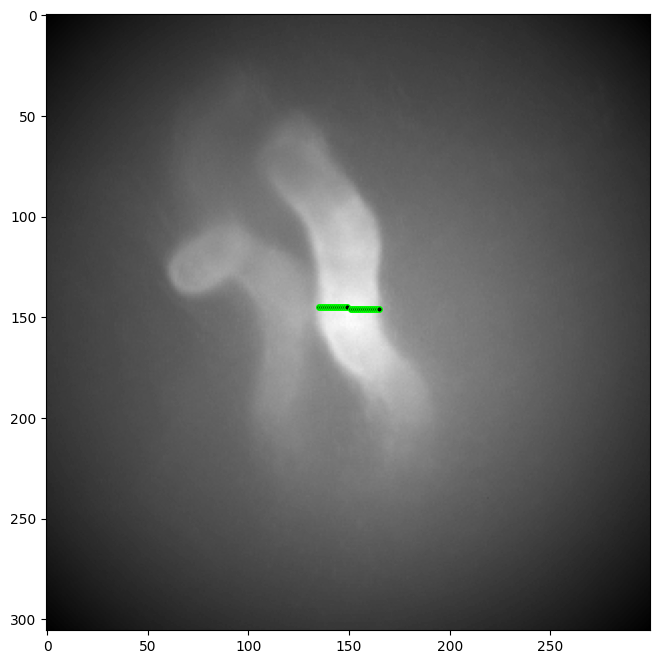

129 /mnt/litebc/patient-data/64992153-68a0-4d36-839c-bfb3de6298ab_0/e239eb54-3db2-40c3-8763-95517c3851e8/stabilzedAvi.avi


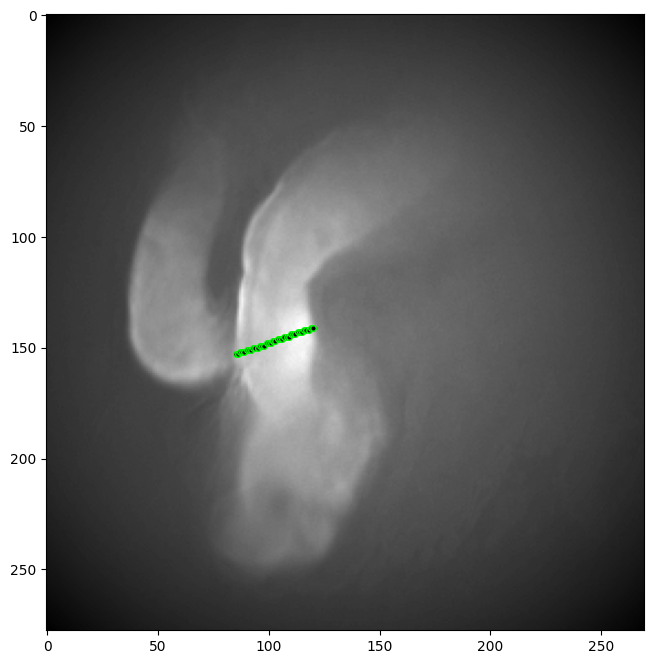

132 /mnt/litebc/patient-data/4001a117-c93f-4cab-8d6f-a10412e26027_0/af95a18e-04c1-4a67-90b9-835ccea3bf2c/stabilzedAvi.avi


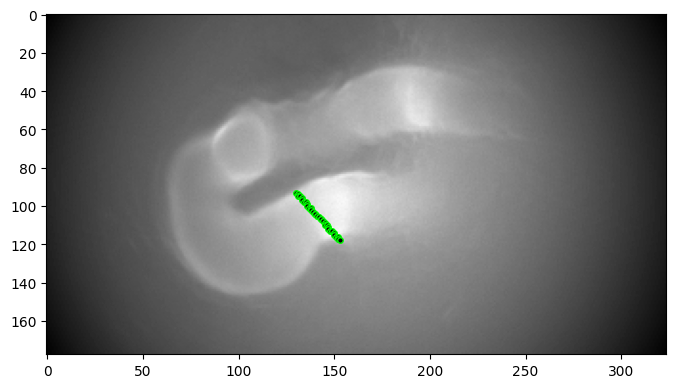

137 /mnt/litebc/patient-data/3d7e9da1-8f50-4082-a847-a7259d4aa1b1_0/dc5dbe4a-aa76-4fa9-afee-566d2999117c/stabilzedAvi.avi


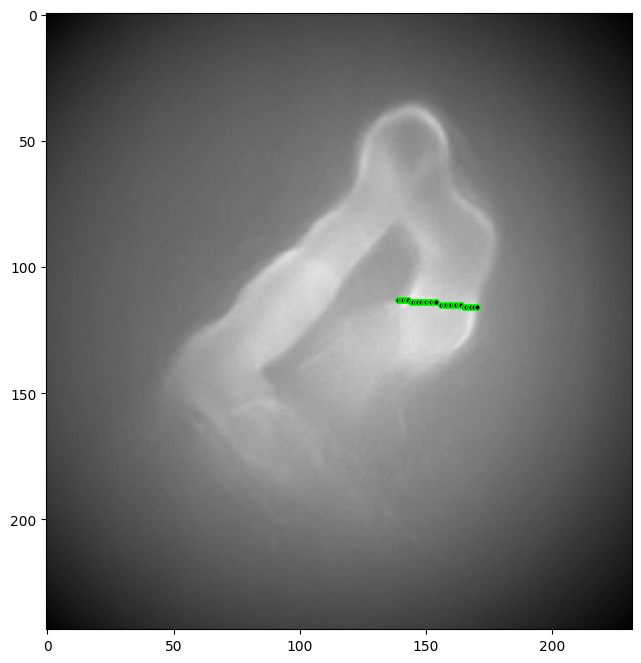

138 /mnt/litebc/patient-data/94abb13b-333b-47dd-9814-95cd39bda488_0/ce3a426e-71e0-4a77-ae79-5a4bb40e2d55/stabilzedAvi.avi


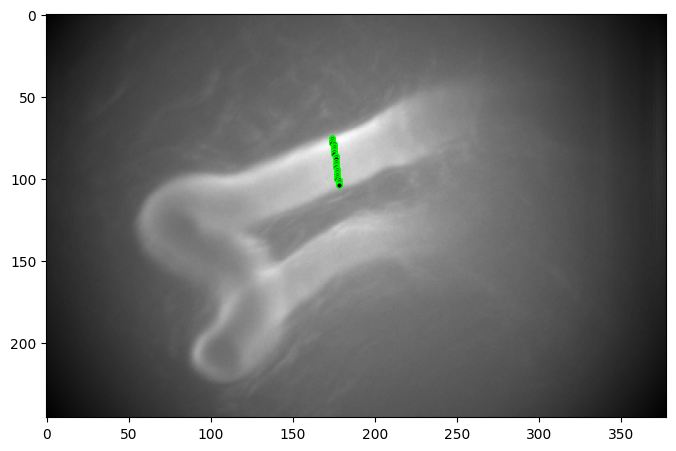

139 /mnt/litebc/patient-data/682e9776-dd87-4eac-a678-58cd0c939d58_0/b07df87f-c13a-41dc-bd51-042fcb6b38d0/stabilzedAvi.avi


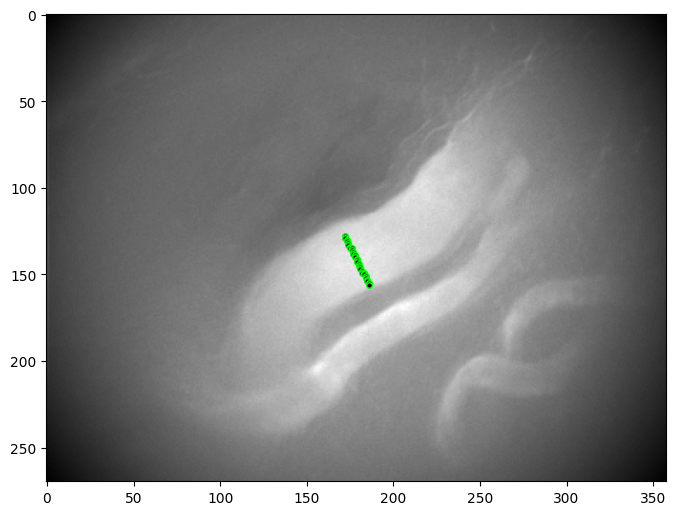

140 /mnt/litebc/patient-data/9442175b-f811-4c0e-8f9d-59d8d1f98682_0/b727921c-e446-4852-be16-05cb0354393f/stabilzedAvi.avi


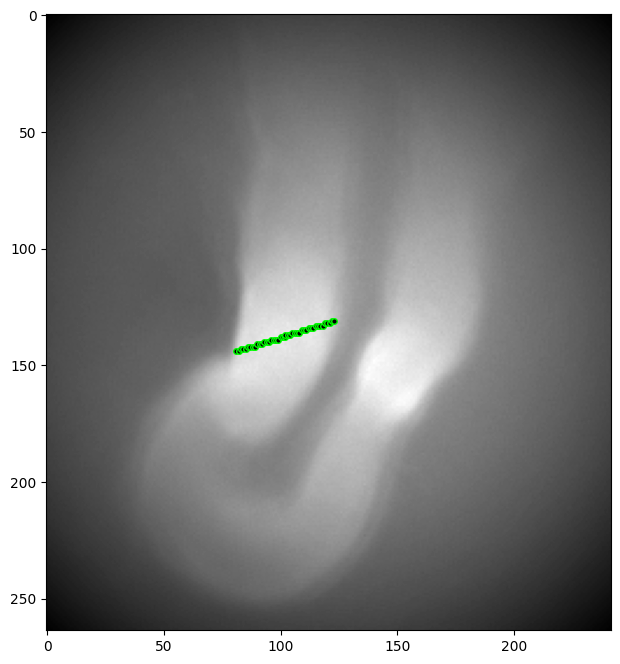

146 /mnt/litebc/patient-data/2c9c9a64-e1bd-4bb8-ac67-608eac95cd4a_0/07c6fc74-28cc-4ddf-86f7-8b8dad3a0814/stabilzedAvi.avi


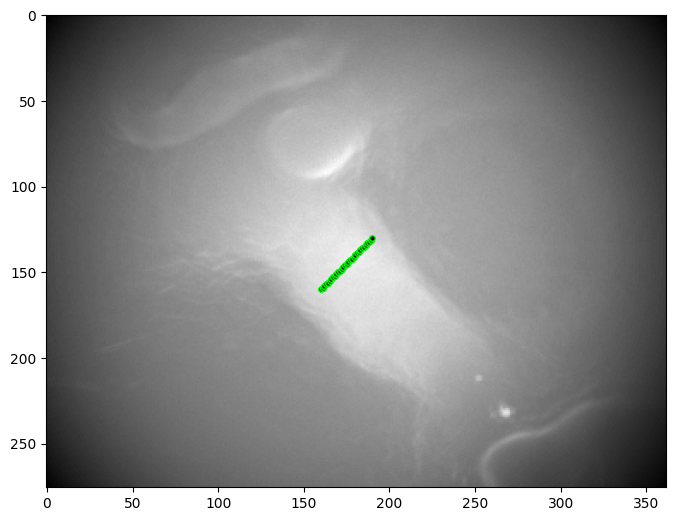

147 /mnt/litebc/patient-data/0650605b-9672-426d-888b-7c65df67b6de_0/8083c85b-d0e3-445d-91b9-e7049cfdbe62/stabilzedAvi.avi


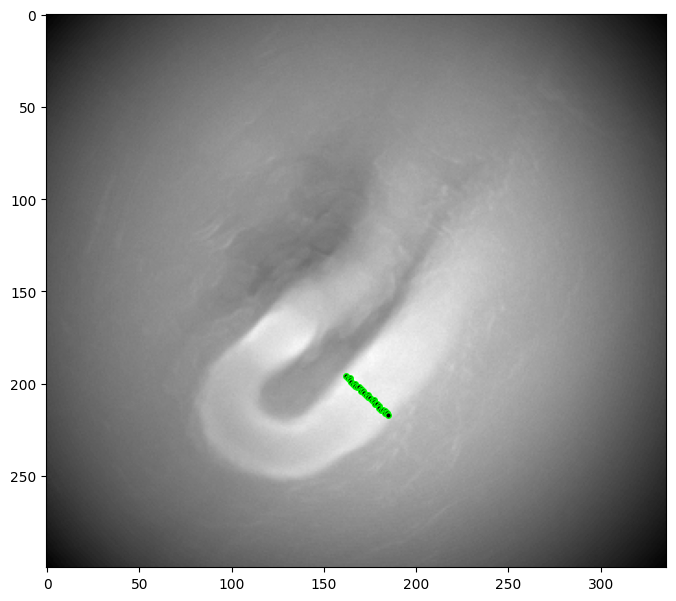

148 /mnt/litebc/patient-data/14d6a9d9-afb9-497f-b1ce-f348db4ff47e_0/4784e928-49d7-4881-b1bd-e5fe600006a7/stabilzedAvi.avi


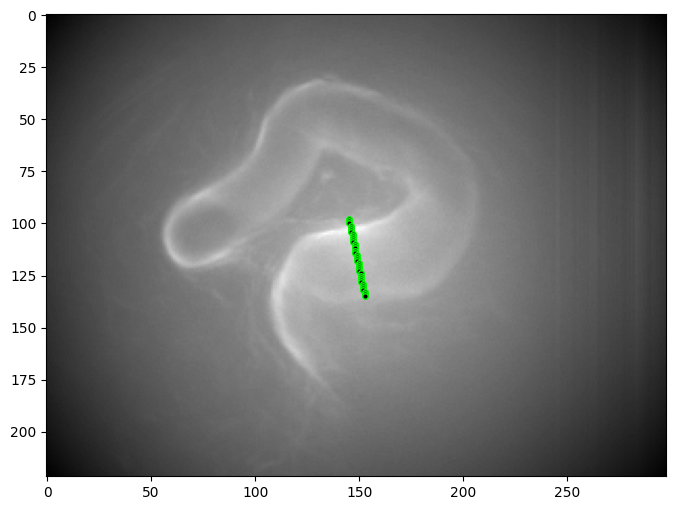

156 /mnt/litebc/patient-data/72099d2a-0d25-4074-b887-50677d9b7baf_0/85d733b2-c5c0-4490-8426-b0dbff3a23c2/stabilzedAvi.avi


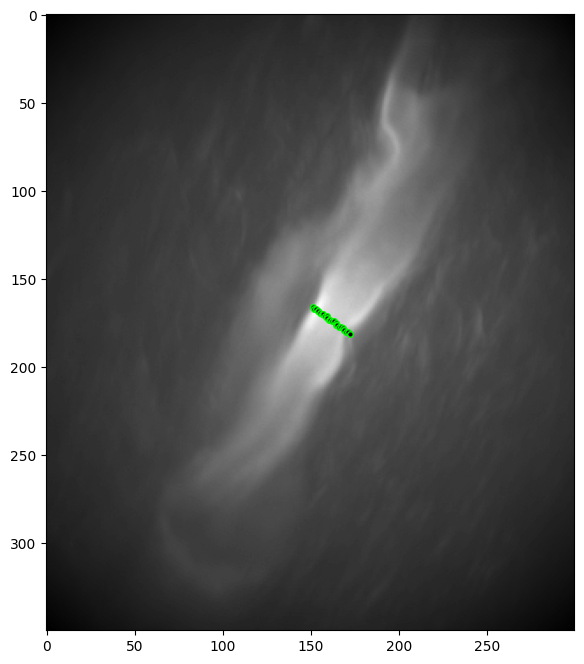

161 /mnt/litebc/patient-data/0d7fa7ce-1c4a-4ec9-a87f-34706df93e4c_0/7696df1d-78e4-43ff-a3b0-1f45a5665280/stabilzedAvi.avi


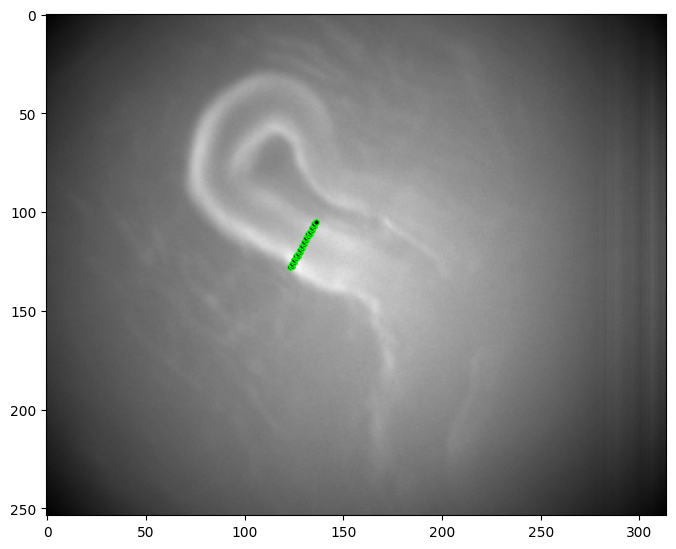

163 /mnt/litebc/patient-data/abfb7295-6b3a-46b9-8067-d11b1f320492_0/2a896204-3fee-4001-9ef1-23e88dc6108c/stabilzedAvi.avi


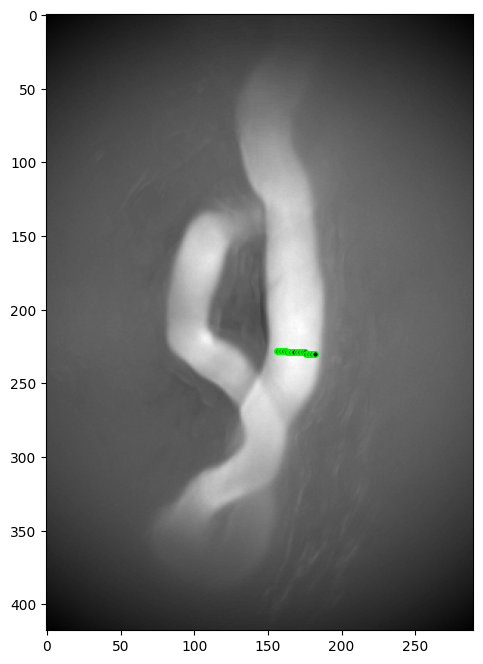

165 /mnt/litebc/patient-data/abfb7295-6b3a-46b9-8067-d11b1f320492_0/c64528ea-88b6-4293-abc9-05291974128c/stabilzedAvi.avi


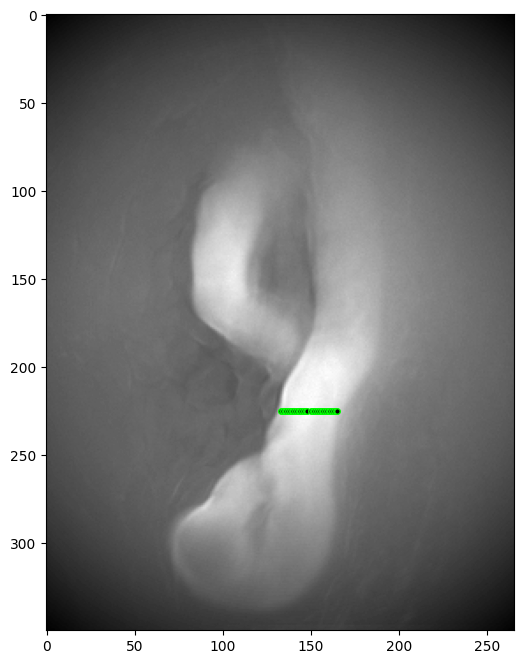

166 /mnt/litebc/patient-data/8fc777b3-bd64-43ad-abce-b56df341d35b_0/6bf76428-18f8-44c3-a6a0-0dedbc382c16/stabilzedAvi.avi


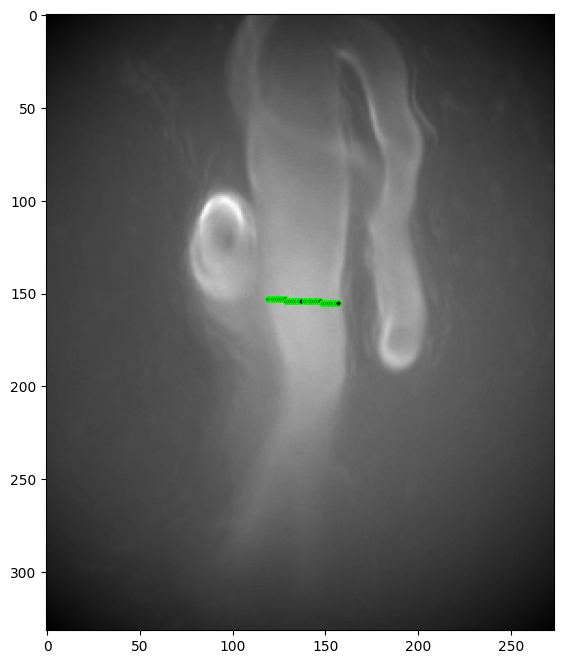

169 /mnt/litebc/patient-data/7c26b706-b940-4b64-8367-da281f9e8392_0/0f652891-2055-40e7-98fc-8e8b7fda8933/stabilzedAvi.avi


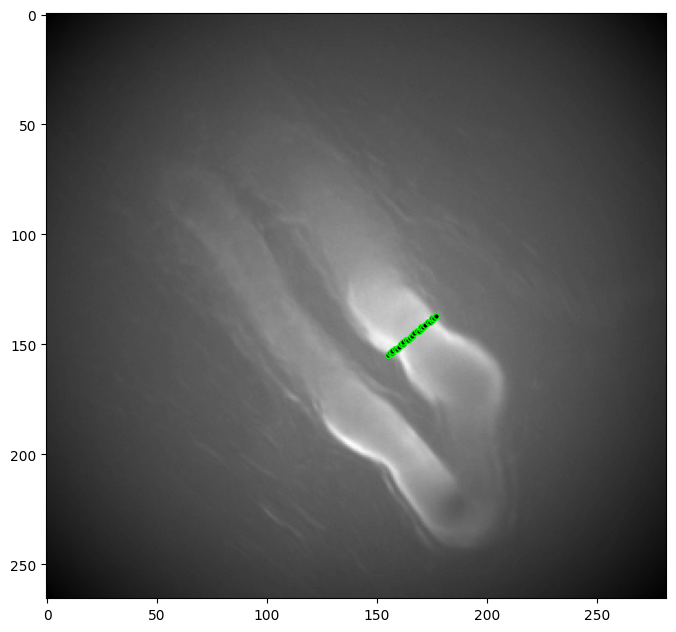

173 /mnt/litebc/patient-data/3a2cdd9b-89cc-4958-92fa-21a444fc7828_0/2702b7a7-193a-4bcd-a7f0-c1a4e46fd5f4/stabilzedAvi.avi


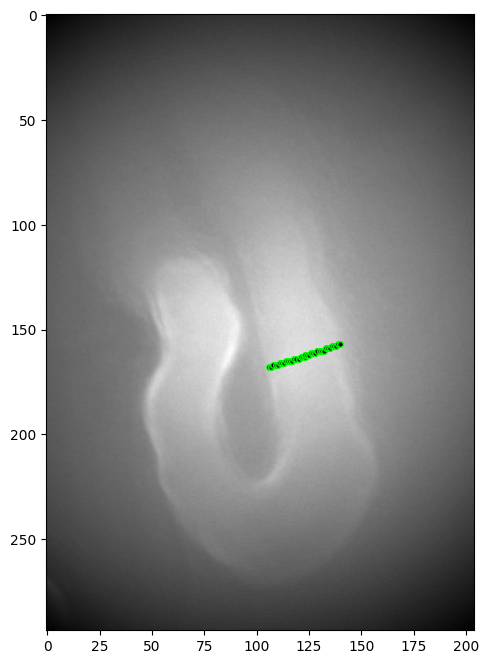

180 /mnt/litebc/patient-data/72f21e64-d02a-4639-b682-8d4d79f83a21_0/9c9c2f0b-e297-47fe-8ef1-29a752e6e985/stabilzedAvi.avi


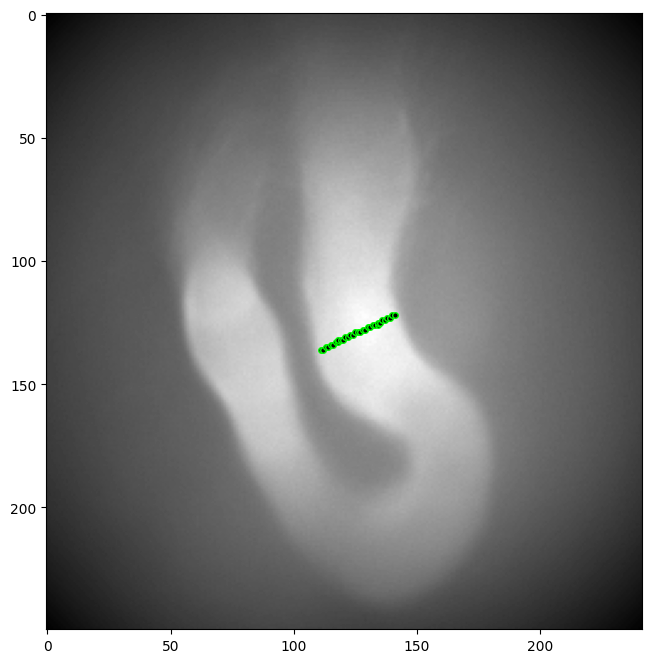

184 /mnt/litebc/patient-data/5cab0b56-4934-4976-b0b2-2f753fab07e1_0/d0a34a69-4e46-4bf9-bf81-6fae79e9dfb1/stabilzedAvi.avi


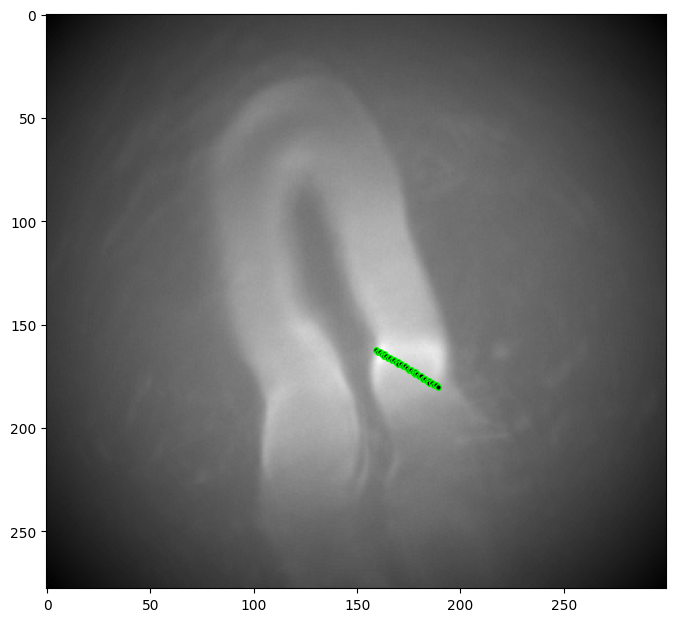

185 /mnt/litebc/patient-data/99d4e760-f754-490b-8beb-95ef40b969a6_0/08f77e39-c71e-45f4-922b-be5eaf50e135/stabilzedAvi.avi


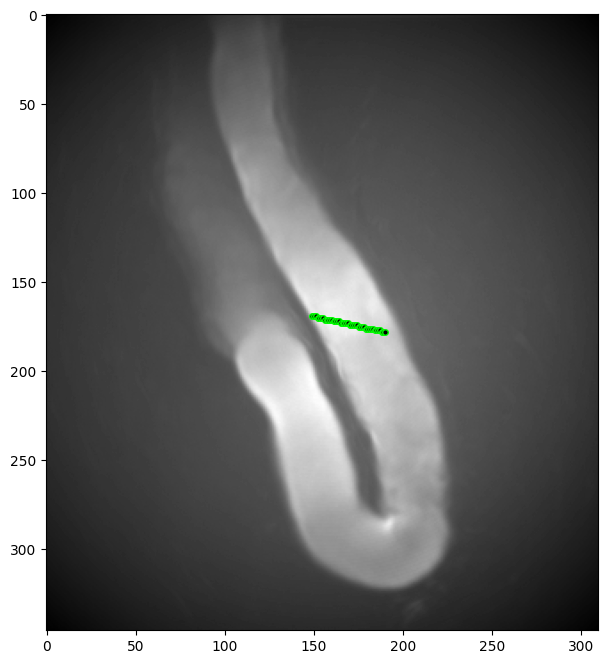

188 /mnt/litebc/patient-data/72099d2a-0d25-4074-b887-50677d9b7baf_0/bd7fd4e0-6257-402f-9308-f30666ca4ca6/stabilzedAvi.avi


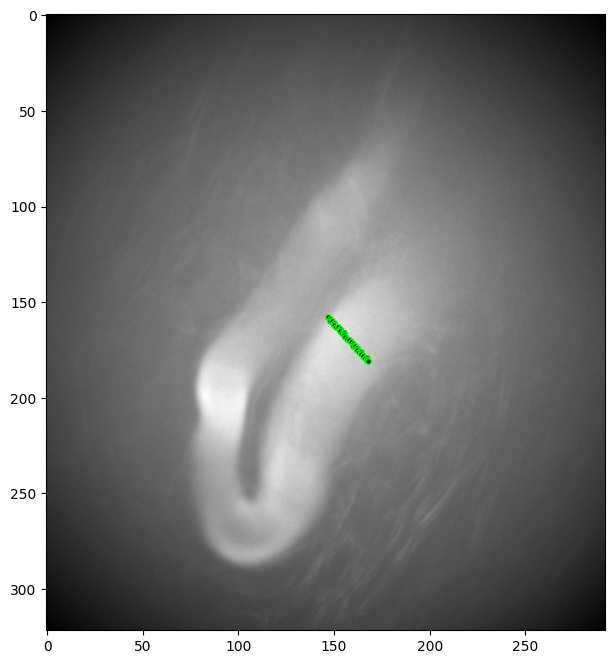

191 /mnt/litebc/patient-data/24db8e21-f7e1-44d5-985f-ce4c8ce0938f_0/44bdc1aa-f180-49aa-9645-0f9044f69ac4/stabilzedAvi.avi


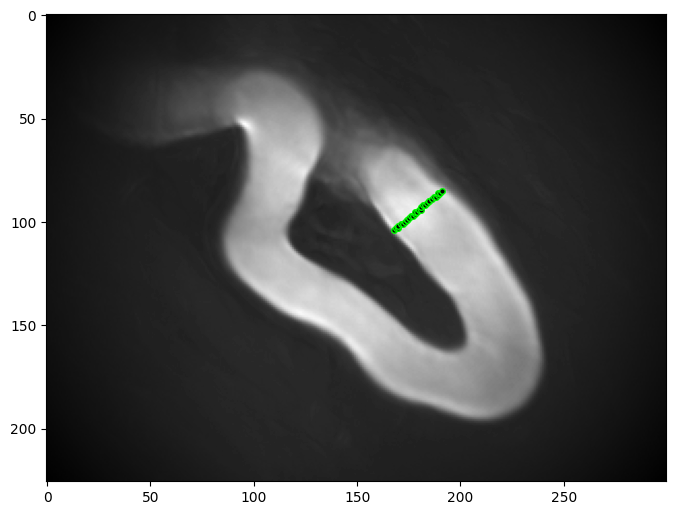

192 /mnt/litebc/patient-data/72099d2a-0d25-4074-b887-50677d9b7baf_0/863c4a5b-9561-45e0-b2a2-6fedea2d9261/stabilzedAvi.avi


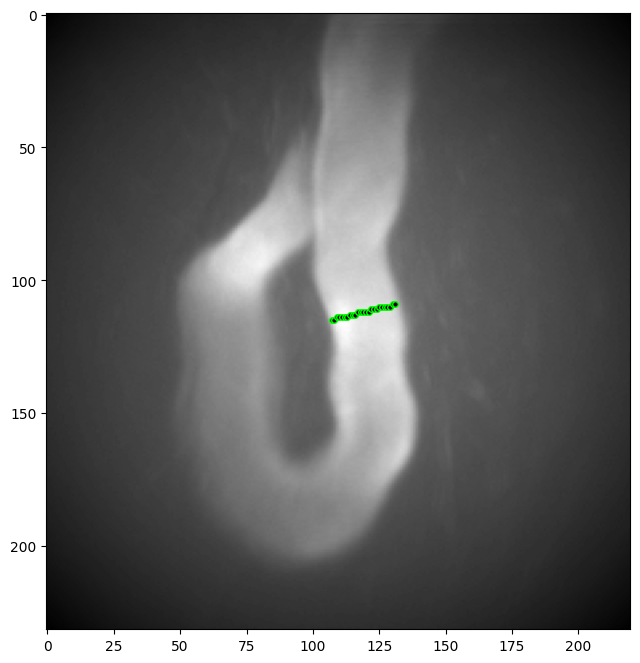

193 /mnt/litebc/patient-data/5be6e56a-8894-4679-9b87-84feec0af411_0/97eae325-9101-4c1d-b2ed-583fbde45a78/stabilzedAvi.avi


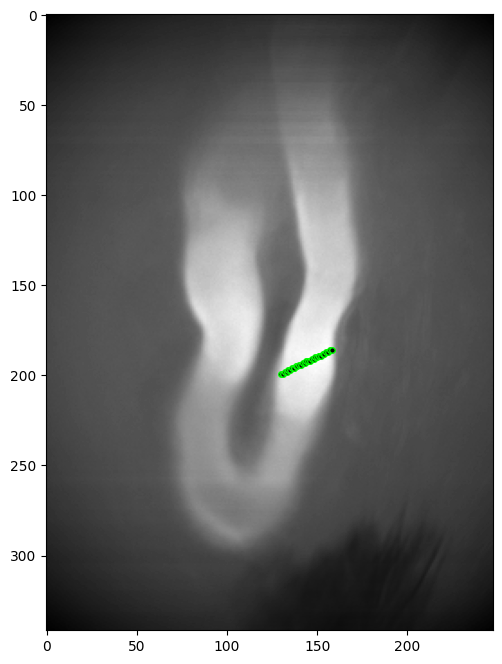

In [7]:
for idx, fl in enumerate(files):
  with open(fl, 'rb') as f:
    video_file, video_points, y, points_on_line, total_diff, mean_angles, (date2, hgb, wbc) = pickle.load(f)
    if video_file not in good_file_names:
      continue
    print(good_files[good_file_names.index(video_file)], video_file)
    for p in points_on_line:
      plt.plot(p[0], p[1], marker="o", markersize=4, markeredgecolor=(0, 1, 0), markerfacecolor=(0, 0, 0))
    plt.imshow(total_diff, cmap='gray')
    plt.show()

Collecting and plotting the counts for the images where a good cut was found:

In [8]:
counts = []
wbcs = []
total_frames = []
line_lengths = []
for idx, stabilized_file_name in enumerate(good_file_names):
  pickeled_file_path = 'xy_data/' + stabilized_file_name.split("/")[-3] + "_" + stabilized_file_name.split("/")[-2] + "_xy.pkl"
  with open(pickeled_file_path, 'rb') as f:
    video_file, video_points, y, points_on_line, total_diff, mean_angles, (date2, hgb, wbc) = pickle.load(f)
    if video_file != stabilized_file_name:
      print("STRANGE")
    counts.append(len(np.where(np.array(y) == 1)[0]))
    wbcs.append(wbc)
    total_frames.append(len(video_points))
    line_lengths.append(len(video_points[0]))

In [9]:
len(counts), len(wbcs), len(total_frames), len(line_lengths)

(80, 80, 80, 80)

In [10]:
np.mean(line_lengths), np.median(line_lengths)

(31.575, 31.0)

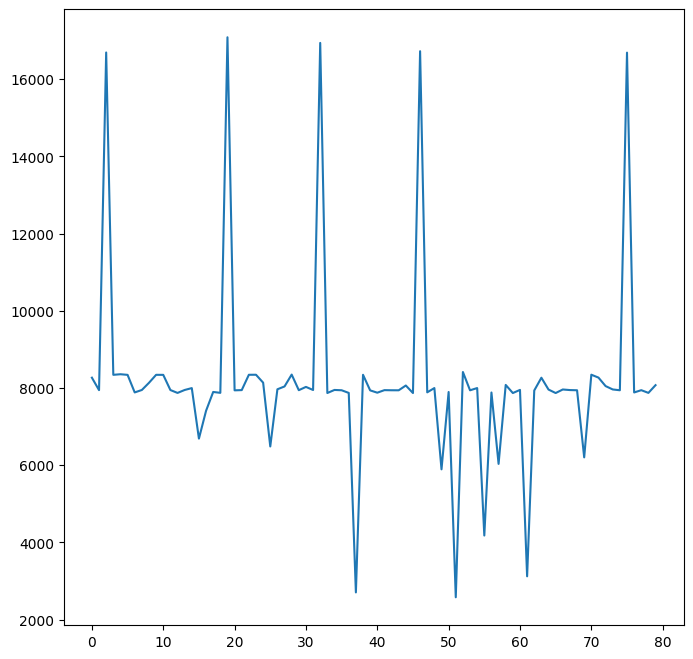

In [11]:
plt.plot(range(0, len(total_frames)), total_frames)
plt.show()

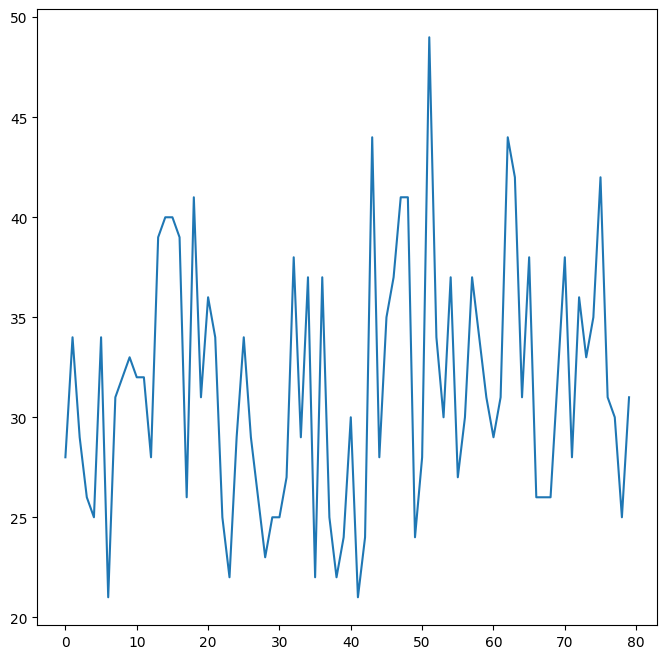

In [12]:
plt.plot(range(0, len(line_lengths)), line_lengths)
plt.show()

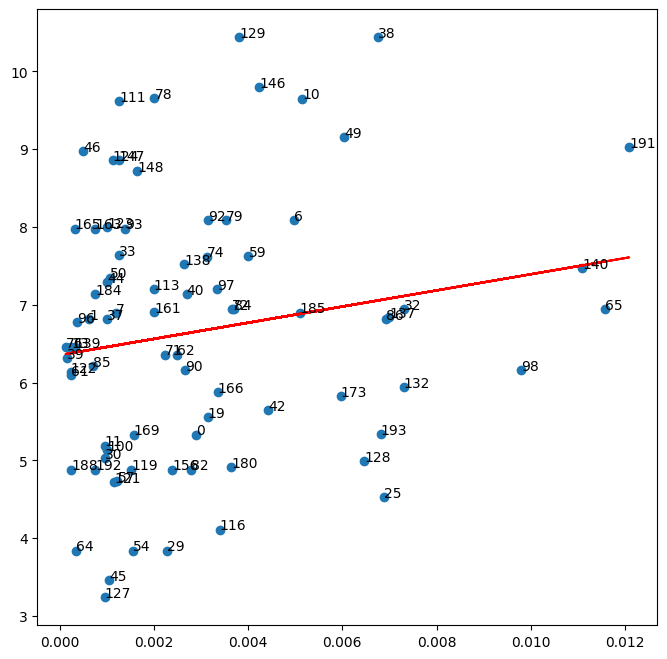

In [13]:
counts_normalized = [counts[i]/total_frames[i] for i in range(len(counts))]
m, c = np.polyfit(counts_normalized, wbcs, 1)
plt.plot(counts_normalized, [m*count + c for count in counts_normalized], 'r', label='Fitted line')
plt.scatter(counts_normalized, wbcs)

for i, txt in enumerate(good_files):
    plt.annotate(str(txt), (counts_normalized[i], wbcs[i]))
plt.show()